# <u>PREDICTION OF NEXT WEEK'S  COVID 19 DEATHS BASED ON THIS WEEK'S DATA</u>
##### SACKO Kalil, Master Student at University of applied Science Bochum, major : Computer Science



# Introduction

This project focuses on predicting COVID-19-related deaths for the upcoming week based on data from the current week. It is a seminar project in the field of Big Data, inspired by a Kaggle competition. The competition that serves as the foundation for this project can be found at the following link: https://www.kaggle.com/competitions/Covid19-Death-Predictions/overview.

The goal of the project is to make accurate predictions while gaining significant insights from the data. Modern analytical methods and machine learning techniques are employed to address the challenges posed by this real-world scenario.



# -------------------------------APPROACH-----------------------------
# I. EXPLORATORY DATA ANALYSIS
# Objective:
**To understand the available data as thoroughly as possible in order to define a modeling strategy.**

# Basic Checklist (not exhaustive):
# I-I. Basic Analysis (Analysis of the Data Structure)
- **Target Variable**
- **Number of Rows and Columns**
- **Variable Types**
- **Descriptive Analysis**
- **Analysis of Missing Values**
- **Analysis of Outliers**
- **Analysis of Variable Distributions**

## I-II. Content Analysis:
- **Objective**: 
**To examine the relationships between variables and identify potential hypotheses for testing**
- **Exploration of the Target Variable**  
- **Relationships between Variables and the Target Variable**
- **Relationships among Independent Variables**
- **Temporal and Geographical Analysis**
- **Vaccination and Its Effects**

## I-III. Hypotheses to be tested:
### Null Hypotheses (H₀)

- **Hypothesis 1: Do regions with higher vaccination rates have lower weekly death counts?**
- **Hypothesis 2: Do regions with higher COVID-19 case numbers have higher death rates?**
- **Hypothese 3 : Hypothesis 3: Do regions with higher weekly death rates also have higher death rates in the following week**
- **ETC....**


# II. PRE-PROCESSING

# Objective:
**To transform the data into a format suitable for machine learning.**

## Basic Checklist (not exhaustive):
   - **Creation of Training and Validation(pre-test) Datasets**
   - **Encoding**
   - **Handling NaN Values: dropna(), Imputation**
   - **Treatment of Outliers that Negatively Affect the Model**
   - **Feature Selection**
   - **Feature Engineering**
   - **Feature Scaling**


# III. MODELLING AND TRAINING

# Objective:
**To Develop a machine learning model that fulfills the ultimate goal.**

## Basic Checklist (not exhaustive):
   - **Definition of an Evaluation Function**
   - **Training Various Models**
   - **Learning Curve**
   - **Coefficient of Determination (R² Score)**
   - **Error Analysis and Returning to Preprocessing/EDA (Optional)**
   - **Optimization: Using GridSearchCV and/or RandomizedSearchCV , Applying Ensemble Learners**


# IV. TEST PHASE
- **Final test of the selected best model(s) with a new dataset (test set).**


  

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
pd.set_option('display.max_rows', 111)
pd.set_option('display.max_columns', 111)

In [4]:
data = pd.read_csv('train.csv')

# I. EXPLORATORY DATA ANALYSIS
## I-I. Basic Analysis (Analysis of the Data Structure)

#### Number of rows and columns

In [7]:
data

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,911530868,World,2372.0,2020,0.300,65.0,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,344.0
1,807936902,World,5023.0,2020,0.635,114.0,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.0
2,773590408,World,5612.0,2020,0.710,116.0,0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,431.0
3,130466459,World,7580.0,2020,0.958,153.0,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,463.0
4,544040446,World,8983.0,2020,1.136,187.0,0.024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,506.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129151,541829605,Zimbabwe,464.0,2022,29.012,13.0,0.813,11949993.0,6297324.0,4601845.0,1050824.0,5665.0,74.72,39.37,28.77,6.57,354.0,1427.0,0.009,9.0
129152,969939474,Zimbabwe,471.0,2022,29.449,12.0,0.750,11958771.0,6299348.0,4605821.0,1053602.0,5295.0,74.77,39.39,28.80,6.59,331.0,1362.0,0.009,7.0
129153,667902340,Zimbabwe,450.0,2022,28.136,13.0,0.813,NaN,NaN,NaN,NaN,5316.0,NaN,NaN,NaN,NaN,332.0,1483.0,0.009,5.0
129154,961193720,Zimbabwe,277.0,2022,17.320,6.0,0.375,11974313.0,6305470.0,4611113.0,1057730.0,5358.0,74.87,39.43,28.83,6.61,335.0,1633.0,0.010,7.0


In [8]:
print("Number of rows in the dataset : ", len(data))
print("Number of columns in the dataset : ", len(data.columns))
print("THE TARGET VARIABLE IS 'Next Week's Deaths' : ")

Number of rows in the dataset :  129156
Number of columns in the dataset :  20
THE TARGET VARIABLE IS 'Next Week's Deaths' : 


#### Variable Types

In [10]:
#Variable types
data.dtypes

Id                                       int64
Location                                object
Weekly Cases                           float64
Year                                     int64
Weekly Cases per Million               float64
Weekly Deaths                          float64
Weekly Deaths per Million              float64
Total Vaccinations                     float64
People Vaccinated                      float64
People Fully Vaccinated                float64
Total Boosters                         float64
Daily Vaccinations                     float64
Total Vaccinations per Hundred         float64
People Vaccinated per Hundred          float64
People Fully Vaccinated per Hundred    float64
Total Boosters per Hundred             float64
Daily Vaccinations per Hundred         float64
Daily People Vaccinated                float64
Daily People Vaccinated per Hundred    float64
Next Week's Deaths                     float64
dtype: object

float64    17
int64       2
object      1
Name: count, dtype: int64


<Axes: ylabel='count'>

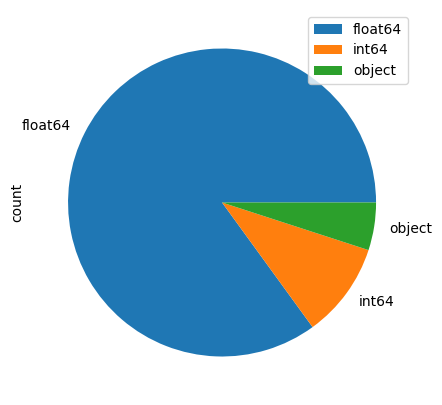

In [11]:
print(data.dtypes.value_counts())
data.dtypes.value_counts().plot(kind='pie', legend=True, figsize=(8,5))

#### Descriptive Analysis

In [13]:
#Descriptive Analysis
data.describe()

,Id,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
count,1.291560e+05,1.289430e+05,129156.000000,128288.000000,127898.000000,127247.000000,4.027000e+04,3.842900e+04,3.657400e+04,1.984700e+04,7.784000e+04,40270.000000,38429.000000,36574.000000,19847.000000,77840.000000,7.739100e+04,77391.000000,129156.000000
mean,5.502597e+08,9.520131e+04,2020.912919,1379.071563,1072.815494,10.845384,2.450093e+08,1.174096e+08,9.862264e+07,4.365458e+07,4.742138e+05,89.723652,43.424276,38.421866,20.160324,2702.988798,1.823430e+05,0.114669,1064.082776
std,2.599890e+08,6.329716e+05,0.739667,4013.421702,5287.848128,24.740908,1.032824e+09,4.932070e+08,4.303844e+08,1.862997e+08,2.593336e+06,74.209648,30.074617,29.197973,22.598973,3468.942102,1.061855e+06,0.202150,5251.447471
min,1.000006e+08,0.000000e+00,2020.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000
25%,3.253421e+08,1.040000e+02,2020.000000,18.291500,1.000000,0.050000,9.900038e+05,5.771390e+05,4.683338e+05,3.894150e+04,1.065000e+03,18.730000,12.810000,8.390000,0.295000,402.000000,3.280000e+02,0.012000,1.000000
50%,5.497285e+08,1.084000e+03,2021.000000,188.584000,13.000000,1.709000,7.772026e+06,4.306986e+06,3.811594e+06,1.397130e+06,9.182500e+03,79.195000,46.330000,38.515000,9.780000,1498.000000,3.287000e+03,0.046000,13.000000
75%,7.756598e+08,9.750000e+03,2021.000000,1046.367750,127.000000,10.934000,4.976308e+07,2.557442e+07,2.168825e+07,1.114840e+07,6.394475e+04,146.290000,70.380000,64.720000,36.860000,3840.000000,2.318000e+04,0.141000,125.000000
max,9.999993e+08,2.406618e+07,2022.000000,104220.239000,103568.000000,1040.710000,1.212140e+10,5.255161e+09,4.816606e+09,2.129044e+09,4.368841e+07,366.870000,128.780000,126.790000,125.850000,117862.000000,2.099974e+07,11.786000,102123.000000


#### Skewness:
- Most columns show a strong **skewness**, which is typical for data with minimal values close to zero and very high maximum values (long-tailed distribution). For example:
**Weekly Cases, Weekly Deaths, Total Vaccinations, People Vaccinated**, etc., exhibit a large difference between the **median (50%)** and the **mean**. This suggests a **right-skewed distribution**.
The presence of very high maximum values (e.g., **Weekly Cases = 24,066,180 and Weekly Deaths = 103,568**) reinforces the idea that these distributions are not **symmetrical**.
#### Distributions around the Median:
- No column seems to be well-distributed around the **median** due to the strong skewness. For example, for **Weekly Deaths**, the **median is 13**, but the **mean is 1,072**, indicating the influence of some extremely high values.
The column **Total Vaccinations per Hundred** shows a **moderate** difference between the **median (79.195) and the mean (89.72)**, suggesting a somewhat **less skewed distribution**, but still **not perfectly symmetrical**.

#### Analysis of missing values

<Axes: >

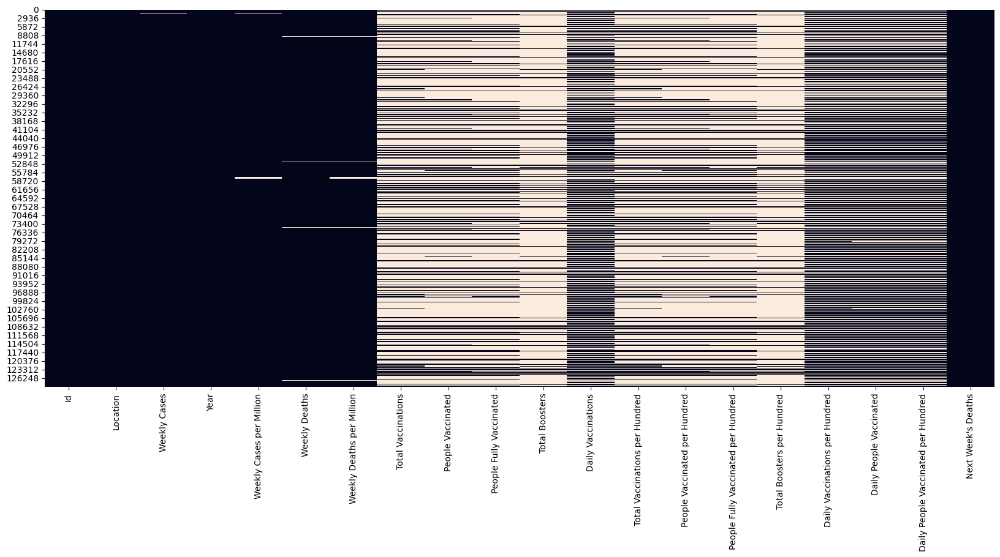

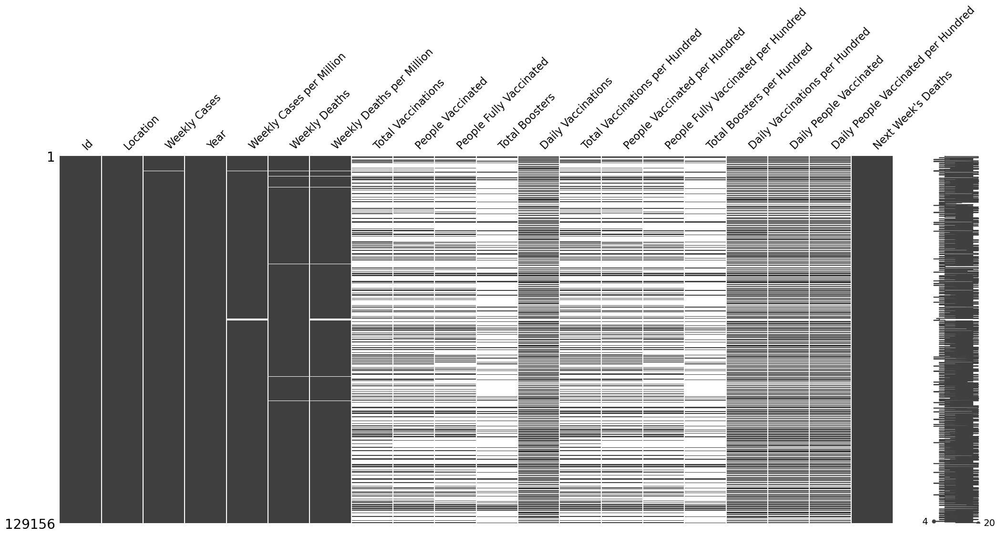

In [16]:
#Analysis of missing values
import missingno as msno
plt.figure(figsize=(20, 8))
sns.heatmap(data.isna(), cbar=False)

msno.matrix(data)

Id                                      0.000000
Year                                    0.000000
Next Week's Deaths                      0.000000
Location                                0.000000
Weekly Cases                            0.164917
Weekly Cases per Million                0.672055
Weekly Deaths                           0.974016
Weekly Deaths per Million               1.478058
Daily Vaccinations per Hundred         39.731797
Daily Vaccinations                     39.731797
Daily People Vaccinated                40.079439
Daily People Vaccinated per Hundred    40.079439
Total Vaccinations per Hundred         68.820651
Total Vaccinations                     68.820651
People Vaccinated                      70.246059
People Vaccinated per Hundred          70.246059
People Fully Vaccinated per Hundred    71.682307
People Fully Vaccinated                71.682307
Total Boosters                         84.633312
Total Boosters per Hundred             84.633312
dtype: float64


<Axes: >

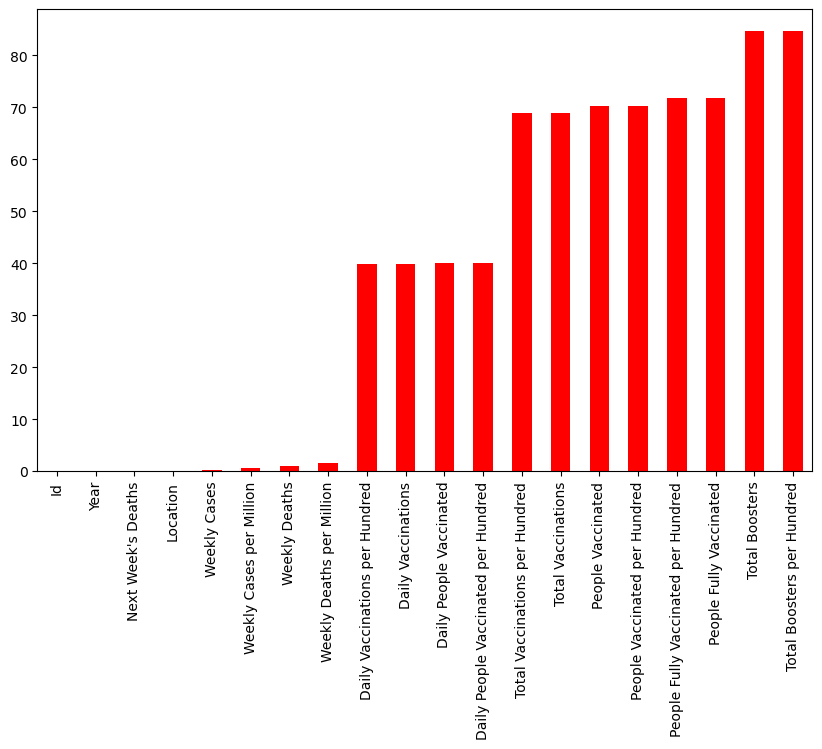

In [17]:
# Percentage of missing values
missing_rate = (data.isna().sum()/data.shape[0])*100
print(missing_rate.sort_values())
missing_rate.sort_values().plot.bar(rot=90, figsize=(10,6), color = 'red')

In [18]:
#The columns that contain more than 60% NaN values in the rows.
missing_groesser_60 = data.columns[missing_rate > 60]
print("More than 60% of the rows contain null values.\n\n",missing_groesser_60)

print("\n********************************************************************************")
missing_zwischen_39_40 = data.columns[(missing_rate > 38) & (missing_rate < 41)]
print("\nUp to 40% of the rows contain null values.\n\n", missing_zwischen_39_40)

print("\n********************************************************************************")
missing_sehr_klein = data.columns[missing_rate < 1.5]
print("\nContain almost no null values.\n\n", missing_sehr_klein)

More than 60% of the rows contain null values.

 Index(['Total Vaccinations', 'People Vaccinated', 'People Fully Vaccinated',
       'Total Boosters', 'Total Vaccinations per Hundred',
       'People Vaccinated per Hundred', 'People Fully Vaccinated per Hundred',
       'Total Boosters per Hundred'],
      dtype='object')

********************************************************************************

Up to 40% of the rows contain null values.

 Index(['Daily Vaccinations', 'Daily Vaccinations per Hundred',
       'Daily People Vaccinated', 'Daily People Vaccinated per Hundred'],
      dtype='object')

********************************************************************************

Contain almost no null values.

 Index(['Id', 'Location', 'Weekly Cases', 'Year', 'Weekly Cases per Million',
       'Weekly Deaths', 'Weekly Deaths per Million', 'Next Week's Deaths'],
      dtype='object')


#### ---------------------------------------------------------------------------------------------------------------------

- The columns **'Total Vaccinations', 'People Vaccinated', 'People Fully Vaccinated', 'Total Boosters', 'Total Vaccinations per Hundred', 'People Vaccinated per Hundred', 'People Fully Vaccinated per Hundred', and 'Total Boosters per Hundred'** have **NaN (null) values** in more than **60%** of the entire rows.

- The columns **'Daily Vaccinations', 'Daily Vaccinations per Hundred', 'Daily People Vaccinated', and 'Daily People Vaccinated per Hundred'** also contain **up to 40% null values**.

- The columns **'Id', 'Location', 'Weekly Cases', 'Year', 'Weekly Cases per Million', 'Weekly Deaths', 'Weekly Deaths per Million', and 'Next Week's Deaths'** have almost no (or very few – for the columns **Weekly Cases, Weekly Cases per Million, Weekly Deaths, Weekly Deaths per Million**) null values (**0-5%**).

#### Analysis of Outliers

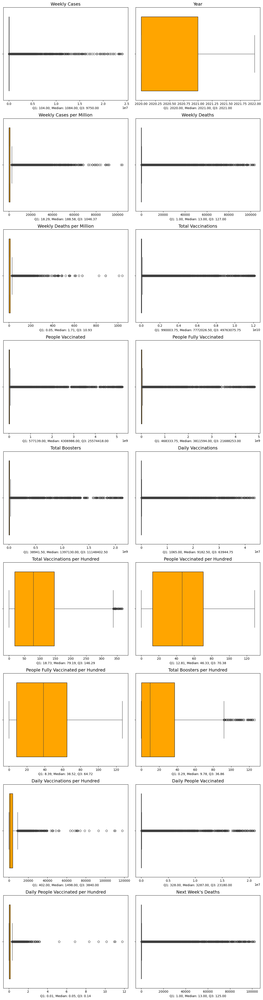

In [22]:
# BOXPLOT OF COLUMNS
# for col in data.columns: 
#     if data[col].dtype in ['int64', 'float64']:  
#         Q1 = data[col].quantile(0.25)  # Erstes Quartil
#         Q3 = data[col].quantile(0.75)  # Drittes Quartil
#         median = data[col].median() 
        
#         plt.figure(figsize=(8, 5))  
#         sns.boxplot(data[col], boxprops=dict(facecolor='orange', edgecolor='black'))  
#         plt.title(f'{col}', fontsize=14)  
        
#         # Hinzufügen der statistischen Informationen als text.
#         plt.xlabel(f'Q1: {Q1:.2f}, Median: {median:.2f}, Q3: {Q3:.2f}', fontsize=12)
#         plt.ylabel('Werte', fontsize=12)
        
#         plt.show()  

cols_per_row = 2
num_cols = len([col for col in data.drop(["Location", "Id"], axis=1).columns] )
rows = (num_cols + cols_per_row - 1) // cols_per_row  #Calculation of the required number of rows.

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(data.drop(["Location", "Id"], axis=1).columns):
        Q1 = data[col].quantile(0.25)  # first Quartile
        Q3 = data[col].quantile(0.75)  # third Quartile
        median = data[col].median()  # Median

        sns.boxplot(ax=axes[i], x=data[col], boxprops=dict(facecolor='orange', edgecolor='black'))
        axes[i].set_title(f'{col}', fontsize=14)
        axes[i].set_xlabel(f'Q1: {Q1:.2f}, Median: {median:.2f}, Q3: {Q3:.2f}', fontsize=10)
        axes[i].set_ylabel('')

#Hiding unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)


plt.tight_layout()
plt.show()





For certain variables such as **Weekly Cases, Weekly Deaths, Daily Vaccinations, Daily People Vaccinated, and Next Week's Deaths**, the following observations can be made:

- The values seem to be highly concentrated around a specific **value** or within a **certain range**, with a significant number of **outliers** above the **whiskers**. These outliers are represented by **circles**.
- The box is extremely small, indicating that the interquartile range (**IQR**) is very narrow. This suggests that most of the data lies within a tight range around the **median**.
- Since whiskers are defined as the **last values within 1.5xIQR above or below the quartiles (Q1 and Q3)**, for variables with a very small IQR and simultaneously a very large range of values (e.g., **Weekly Cases**), the whiskers are very close to the edges of the box or even merged with them, making them difficult to see.

#### Analysis of variables' distributions

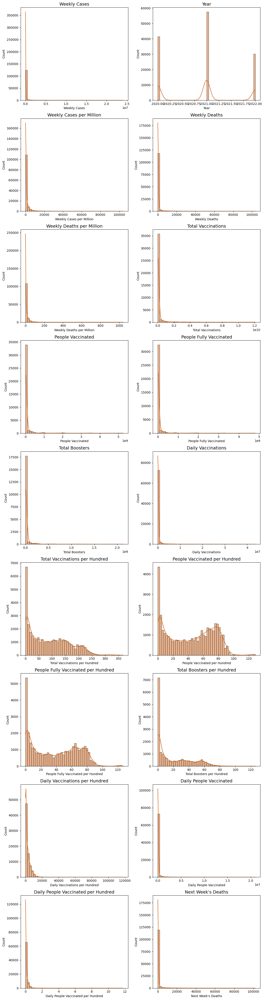

In [25]:
# HISTOGRAMME OF THE VARIABLES

cols_per_row = 2
num_cols = len([col for col in data.drop(["Location", "Id"], axis=1).columns] )
rows = (num_cols + cols_per_row - 1) // cols_per_row  #Calculation of the number of required rows 

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(data.drop(["Location", "Id"], axis=1).columns) : 
        sns.histplot(ax = axes[i], x = data[col], bins=50, kde=True,  color='chocolate')
        axes[i].set_title(f'{col}', fontsize=14)

#Hiding unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)
    
plt.tight_layout()
plt.show()

In [26]:
# SKEWNESS OF VARIABLES
skewdata = data.drop("Location", axis=1)
skewness = skewdata.skew()
print(f"Skewness of the features(columns) :\n{skewness}" )

Skewness of the features(columns) :
Id                                     -0.000918
Weekly Cases                           17.334228
Year                                    0.139635
Weekly Cases per Million                7.806967
Weekly Deaths                           9.096170
Weekly Deaths per Million               8.303667
Total Vaccinations                      7.061840
People Vaccinated                       6.846799
People Fully Vaccinated                 7.143399
Total Boosters                          6.990664
Daily Vaccinations                      9.282717
Total Vaccinations per Hundred          0.518582
People Vaccinated per Hundred          -0.023551
People Fully Vaccinated per Hundred     0.150049
Total Boosters per Hundred              0.934193
Daily Vaccinations per Hundred          5.123234
Daily People Vaccinated                10.693151
Daily People Vaccinated per Hundred    13.667387
Next Week's Deaths                      9.087042
dtype: float64


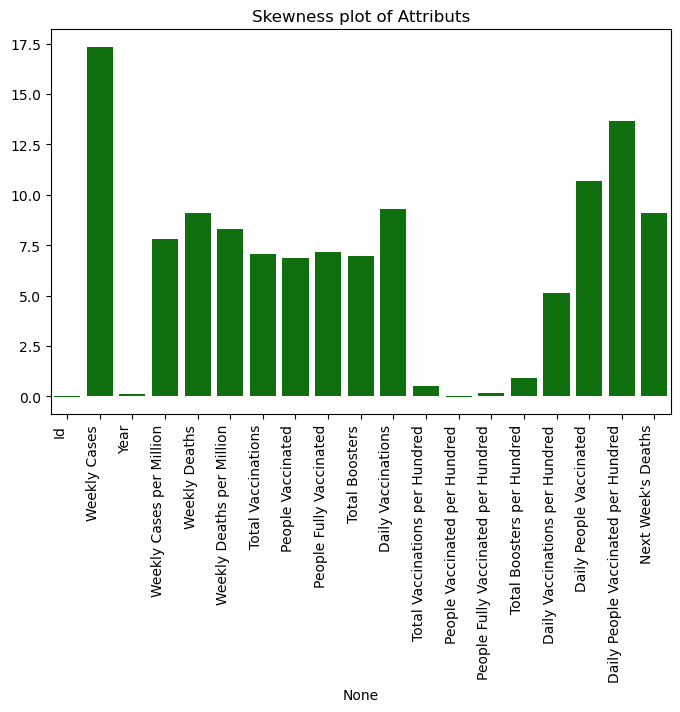

In [27]:
plt.figure(figsize=(8,5))
sns.barplot(x = skewness.index, y = skewness.values, color='green')
plt.title("Skewness plot of Attributs")
plt.xticks(rotation=90, ha='right')
plt.show()

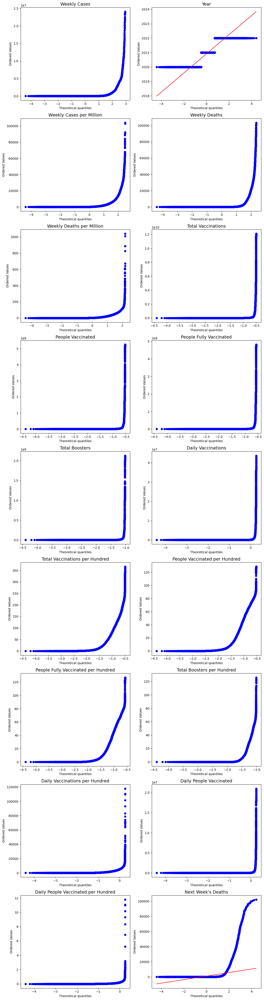

In [28]:
# PROBABILITY PLOT
import scipy.stats as stats

cols_per_row = 2
num_cols = len([col for col in data.drop(["Location", "Id"], axis=1).columns] )
rows = (num_cols + cols_per_row - 1) // cols_per_row  #BCalculation of the number of required rows

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(data.drop(["Location", "Id"], axis=1).columns) :

        stats.probplot(data[col], dist="norm", plot=axes[i])
        axes[i].set_title(f'{col}', fontsize=14)

#Hiding unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)
        
plt.tight_layout()
plt.show()

### Interpretation of Skewness Values:
- A **skewness** close to **0** indicates a **symmetric distribution**.
- A positive **skewness (> 0)** suggests **right-skewness** (**long tail towards higher values**).
- A negative **skewness (< 0)** indicates **left-skewness** (**long tail towards lower values**).
  
### General Conclusions for the Variables:
#### Right-Skewed Variables (Skewness > 0):
Most columns exhibit a high **positive skewness**, suggesting **highly asymmetric distributions** with a **long tail towards higher values**.

### Highly Asymmetric Columns (Skewness > 7):
Columns such as:

**Weekly Cases (17.33)
Weekly Deaths (9.09)
Daily People Vaccinated (10.69)
Daily People Vaccinated per Hundred (13.67)
Daily Vaccinations (9.28)
Weekly Cases per Million, Total Vaccinations, etc.**,have very high **skewness values (> 7)**.
These values highlight the presence of some extremely high observations (outliers).

#### Moderately Right-Skewed Columns:
**Total Vaccinations per Hundred (0.51)
Total Boosters per Hundred (0.93)**
These columns show **moderate asymmetry**, indicating that their **distributions are less extreme** but still not **perfectly symmetric**.

#### Left-Skewed Variables (Skewness < 0):
**People Vaccinated per Hundred (-0.02)**
The skewness is very close to **0**, suggesting an **almost symmetric distribution** for this column.


### ------------------------------------------------------------------------------------------------------------------------------

### Probability Plot
#### Axes of the Diagram:
- **X (Theoretical Quantiles)**: These represent the quantiles of a standard normal distribution (or another specified distribution).
- **Y (Ordered Values)**: These are the sorted data values from the sample.
- **Red Line (Reference Line)**: Represents an ideal normal distribution. If the blue points align with the red line, the data closely follows a normal distribution.
#### Deviations from the Line:
Points aligned on the red line: Indicate that the data fits a normal distribution well.
Points deviating from the red line: Suggest that the data does not follow a normal distribution.

#### Findings Based on This Analysis:
It was observed that almost no variable in the dataset follows a normal distribution. Most distributions are asymmetric around their means, confirming deviations from normality.

## I-II. Content analysis:

#### Relationships between independent variables and the target variable

In [33]:
data

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,911530868,World,2372.0,2020,0.300,65.0,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,344.0
1,807936902,World,5023.0,2020,0.635,114.0,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.0
2,773590408,World,5612.0,2020,0.710,116.0,0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,431.0
3,130466459,World,7580.0,2020,0.958,153.0,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,463.0
4,544040446,World,8983.0,2020,1.136,187.0,0.024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,506.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129151,541829605,Zimbabwe,464.0,2022,29.012,13.0,0.813,11949993.0,6297324.0,4601845.0,1050824.0,5665.0,74.72,39.37,28.77,6.57,354.0,1427.0,0.009,9.0
129152,969939474,Zimbabwe,471.0,2022,29.449,12.0,0.750,11958771.0,6299348.0,4605821.0,1053602.0,5295.0,74.77,39.39,28.80,6.59,331.0,1362.0,0.009,7.0
129153,667902340,Zimbabwe,450.0,2022,28.136,13.0,0.813,NaN,NaN,NaN,NaN,5316.0,NaN,NaN,NaN,NaN,332.0,1483.0,0.009,5.0
129154,961193720,Zimbabwe,277.0,2022,17.320,6.0,0.375,11974313.0,6305470.0,4611113.0,1057730.0,5358.0,74.87,39.43,28.83,6.61,335.0,1633.0,0.010,7.0


In [34]:
unab_variablen = data.drop(["Id", "Next Week's Deaths"], axis=1)
target = data["Next Week's Deaths"]


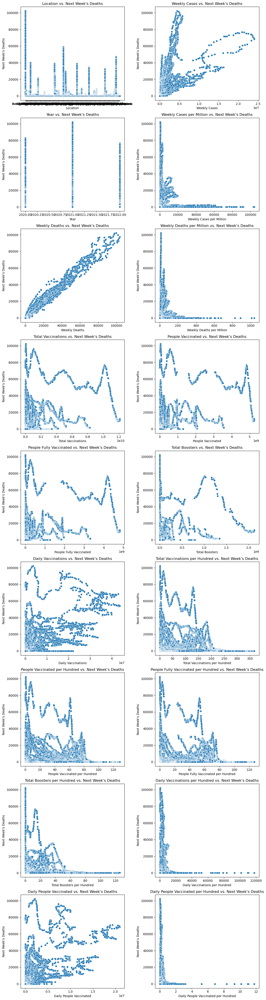

In [35]:
cols_per_row = 2
num_cols = len([col for col in unab_variablen.columns] )
rows = (num_cols + cols_per_row - 1) // cols_per_row  #Calculation of the number of required rows

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(unab_variablen.columns):

    sns.scatterplot(ax = axes[i], x=unab_variablen[col], y=target)
    axes[i].set_title(f"{col} vs. Next Week's Deaths")
    axes[i].set_xlabel(f"{col}")
    axes[i].set_ylabel("Next Week's Deaths")

#Hiding unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

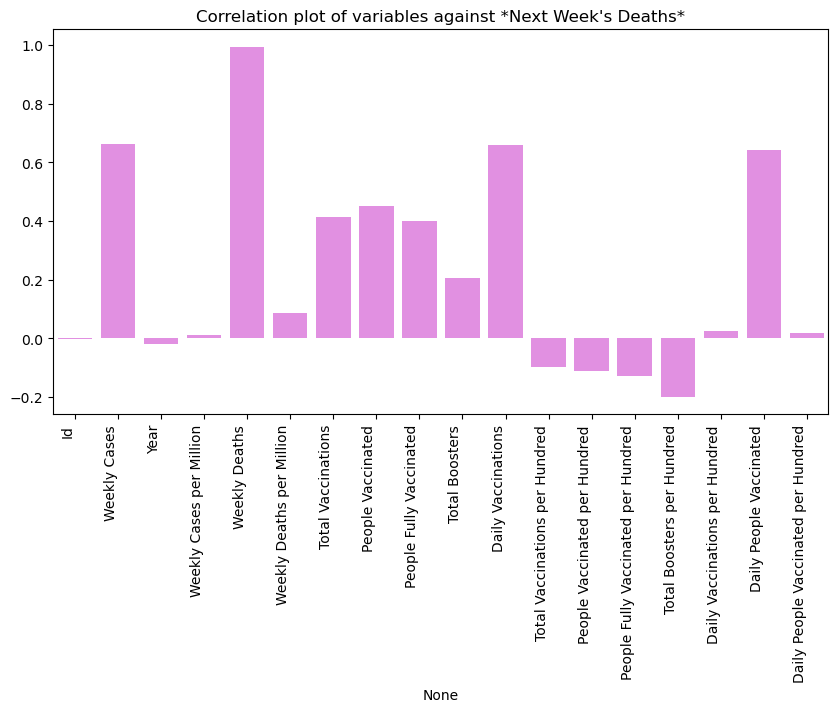

In [36]:
correlation_matrix = data.drop('Location',axis=1).corr()
correlations_with_target = correlation_matrix["Next Week's Deaths"].drop("Next Week's Deaths")
plt.figure(figsize=(10,5))
sns.barplot(x= correlations_with_target.index, y=correlations_with_target.values, color = 'violet')
plt.title("Correlation plot of variables against *Next Week's Deaths*")
plt.xticks(rotation=90, ha='right')
plt.show()


**The correlation plot** reveals the relationship between **Next Week's Deaths** and other variables. Among the variables, some show a strong correlation with **Next Week's Deaths**, such as **Weekly Deaths**, which has a correlation of **0.9**. On the other hand, variables like **Weekly Cases, Daily Vaccinations, and Daily People Vaccinated** exhibit a **weaker correlation** with **Next Week's Deaths**, indicating that they are less closely related

#### Relationships between independent variables

In [39]:
#Copy of original dataset
df = data.copy()

In [40]:
# Deletion of NaN values, as sns.pairplot() does not accept NaN values and is also very time-consuming, especially when there are many rows..
df.dropna(axis=0, inplace=True)
#df.drop("Id", axis=1, inplace=True)
df.head()


,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
241,275164452,World,4174523.0,2020,527.800,77527.0,9.802,11875406.0,7231498.0,44680.0,1.0,897447.0,0.15,0.09,0.00,0.0,113.0,690726.0,0.009,81042.0
242,857254713,World,4424216.0,2021,559.369,79456.0,10.046,13722790.0,9050886.0,58460.0,9.0,1079269.0,0.17,0.11,0.00,0.0,136.0,735617.0,0.009,92754.0
243,515683834,World,4553174.0,2021,575.674,80332.0,10.157,17002186.0,11343354.0,191881.0,15.0,1303377.0,0.21,0.14,0.00,0.0,165.0,851085.0,0.011,94477.0
244,725478352,World,4619286.0,2021,584.033,79640.0,10.069,18569106.0,12578084.0,366880.0,23.0,1397939.0,0.23,0.16,0.00,0.0,177.0,845521.0,0.011,96212.0
245,844503137,World,4649535.0,2021,587.857,81042.0,10.246,20361402.0,14002427.0,650359.0,27.0,1581369.0,0.26,0.18,0.01,0.0,200.0,928498.0,0.012,96742.0


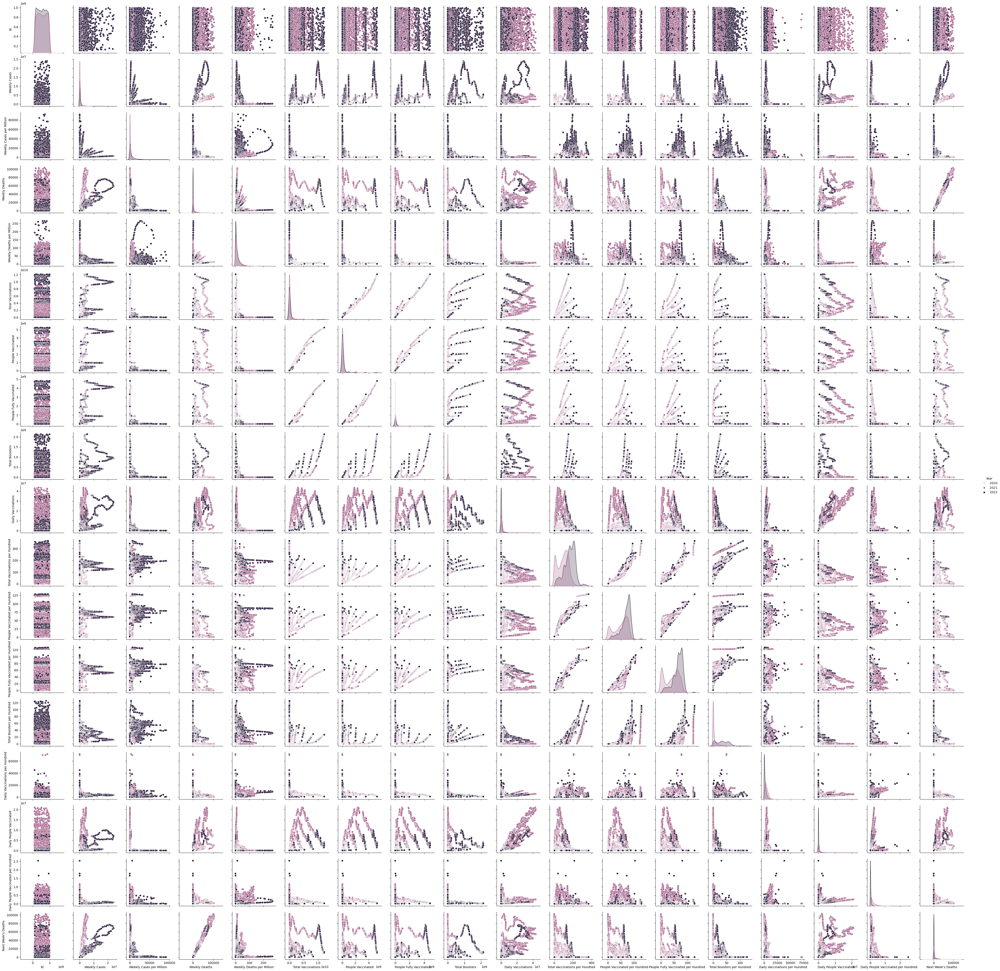

In [41]:
#correlation between variables
sns.pairplot(data=df, hue='Year')

<Axes: >

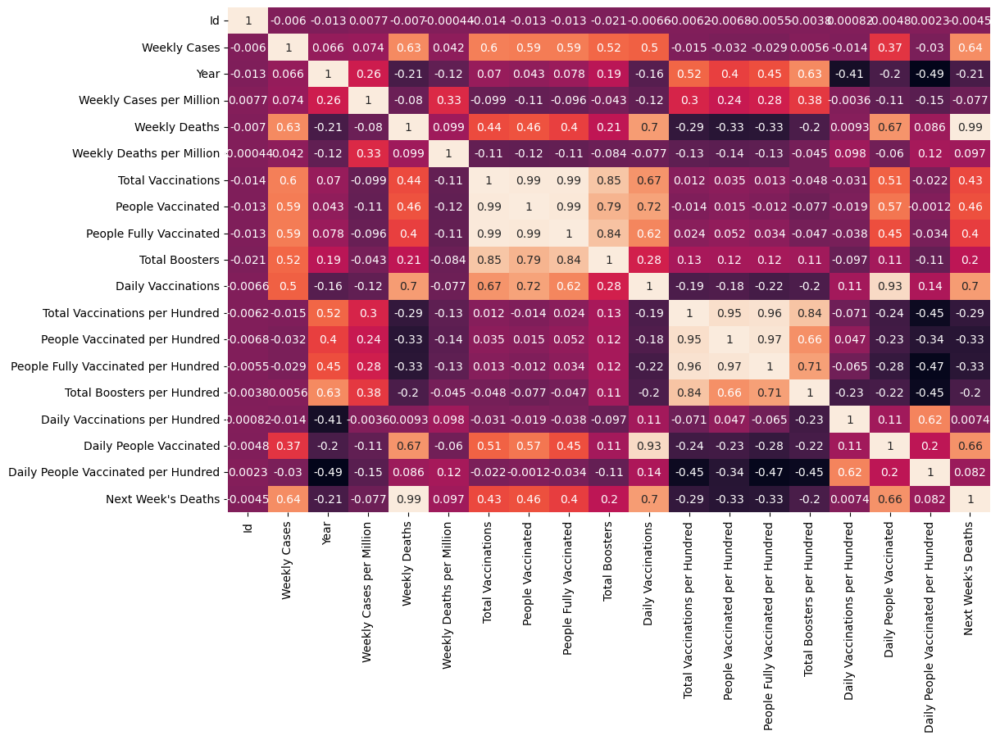

In [42]:
plt.figure(figsize=(12,8))
sns.heatmap(df.drop('Location',axis=1).corr(), annot=True, cbar=False)

**From this analysis, it can be observed that some variables are positively correlated. For example:**  

- **Weekly Deaths** and **Next Week's Deaths** have a correlation coefficient of **0.99**, meaning that higher **Weekly Deaths** correspond to higher **Next Week's Deaths**.  

- **Daily People Vaccinated** and **Daily Vaccinations** have a correlation coefficient of **0.93**.  

- **People Fully Vaccinated per Hundred** and **Total Vaccinations per Hundred** have a correlation coefficient of **0.96**.  

- **People Fully Vaccinated per Hundred** and **People Vaccinated per Hundred** have a correlation coefficient of **0.97**.

#### Temporal and Geographical Analysis

In [45]:
data 

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,911530868,World,2372.0,2020,0.300,65.0,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,344.0
1,807936902,World,5023.0,2020,0.635,114.0,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.0
2,773590408,World,5612.0,2020,0.710,116.0,0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,431.0
3,130466459,World,7580.0,2020,0.958,153.0,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,463.0
4,544040446,World,8983.0,2020,1.136,187.0,0.024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,506.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129151,541829605,Zimbabwe,464.0,2022,29.012,13.0,0.813,11949993.0,6297324.0,4601845.0,1050824.0,5665.0,74.72,39.37,28.77,6.57,354.0,1427.0,0.009,9.0
129152,969939474,Zimbabwe,471.0,2022,29.449,12.0,0.750,11958771.0,6299348.0,4605821.0,1053602.0,5295.0,74.77,39.39,28.80,6.59,331.0,1362.0,0.009,7.0
129153,667902340,Zimbabwe,450.0,2022,28.136,13.0,0.813,NaN,NaN,NaN,NaN,5316.0,NaN,NaN,NaN,NaN,332.0,1483.0,0.009,5.0
129154,961193720,Zimbabwe,277.0,2022,17.320,6.0,0.375,11974313.0,6305470.0,4611113.0,1057730.0,5358.0,74.87,39.43,28.83,6.61,335.0,1633.0,0.010,7.0


In [46]:
#Number of weekly cases and deaths
annual_trends = data.groupby('Year')[["Weekly Cases", "Weekly Deaths"]].sum()
annual_trends

,Weekly Cases,Weekly Deaths
Year,,
2020,1.769078e+09,40011144.0
2021,4.385636e+09,77041928.0
2022,6.120829e+09,20157884.0


<Axes: title={'center': 'Annual evolution of cases and deaths.'}, xlabel='Year'>

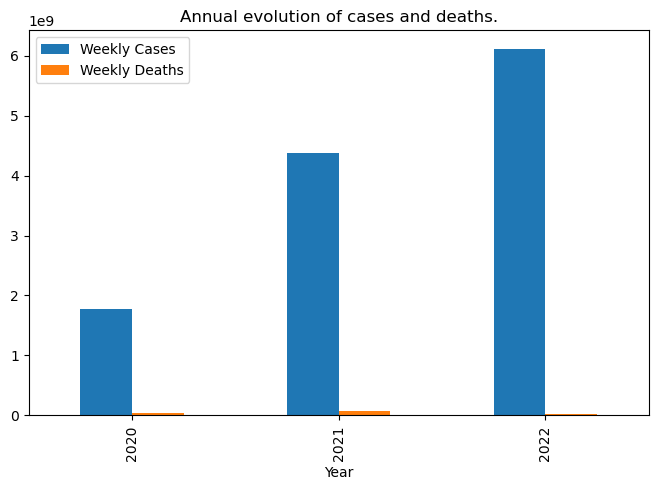

In [47]:
annual_trends.plot(kind='bar', title='Annual evolution of cases and deaths.', figsize=(8,5))

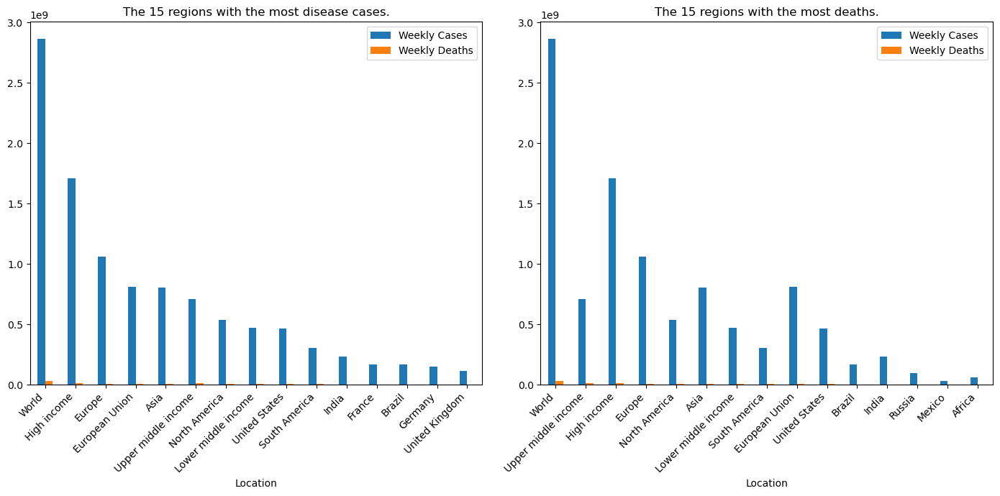

In [48]:
# Regions with higher death rates and disease rates
regional_totals = data.groupby('Location')[['Weekly Cases', 'Weekly Deaths']].sum()

plt.figure(figsize=(14, 7))

#first
plt.subplot(1, 2, 1)
regional_totals.sort_values(by='Weekly Cases', ascending=False).head(15).plot(kind='bar', title='The 15 regions with the most disease cases.', ax=plt.gca())
plt.xticks(rotation=45, ha='right')  

# second
plt.subplot(1, 2, 2)
regional_totals.sort_values(by='Weekly Deaths', ascending=False).head(15).plot(kind='bar', title='The 15 regions with the most deaths.', ax=plt.gca())
plt.xticks(rotation=45, ha='right') 

plt.tight_layout()
plt.show()

In [49]:
import geopandas as gpd
countries_path = "ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp"
world = gpd.read_file(countries_path)
#print(world['GEOUNIT'][4])
world.loc[4, 'GEOUNIT'] = 'United States' #To have the same name of United States as in my dataset.

continents_path = "shapefiles/world-continents.shp"
continents = gpd.read_file(continents_path)
continents.rename(columns={'geometry': 'continent_geometry'}, inplace=True)

#world.head(5)
continents

# Geopandas and other files (such as: ne_110m_admin_0_countries/ne_110m_admin_0_countries.shp and shapefiles/world-continents.shp) are used here 
# in order to represent on the map the different regions most affected by COVID. These files can be downloaded from the link 
# here: https://www.naturalearthdata.com/downloads/110m-cultural-vectors/ in the 'Download countries' section.

,CONTINENT,SQMI,SQKM,continent_geometry
0,Africa,1.158346e+07,3.000115e+07,"MULTIPOLYGON (((35.48832 -21.685, 35.45221 -21..."
1,Antarctica,4.754809e+06,1.231495e+07,"MULTIPOLYGON (((-60.22 -80.28585, -60.23361 -8..."
2,Asia,1.731728e+07,4.485173e+07,"MULTIPOLYGON (((150.8936 -10.64874, 150.88053 ..."
3,Australia,2.973612e+06,7.701651e+06,"MULTIPOLYGON (((158.88218 -54.71139, 158.87967..."
4,Europe,3.821854e+06,9.898597e+06,"MULTIPOLYGON (((23.84853 35.52298, 23.97138 35..."
5,North America,9.339528e+06,2.418936e+07,"MULTIPOLYGON (((-81.67847 7.38861, -81.64945 7..."
6,Oceania,1.656787e+05,4.291076e+05,"MULTIPOLYGON (((169.18552 -52.57695, 169.16165..."
7,South America,6.856255e+06,1.775769e+07,"MULTIPOLYGON (((-67.2089 -55.89104, -67.24695 ..."


In [50]:
#Total number of disease cases per region.
regional_cases = data.groupby('Location')['Weekly Cases'].sum().reset_index()

world_cases = world.merge(regional_cases, left_on='GEOUNIT', right_on='Location', how='outer')
world_cases['Location'] = world_cases['GEOUNIT'].combine_first(world_cases['Location'])

world_cases = world_cases.merge(continents, left_on='Location', right_on='CONTINENT', how='outer')
world_cases['geometry'] = world_cases['geometry'].combine_first(world_cases['continent_geometry'])
world_cases['Location'] = world_cases['Location'].combine_first(world_cases['CONTINENT_y'])

world_cases.head(3)
#world_cases[world_cases["Location"].duplicated()]
#world_cases = world_cases.drop_duplicates(subset=['GEOUNIT'])

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,ADM0_A3,GEOU_DIF,GEOUNIT,GU_A3,SU_DIF,SUBUNIT,SU_A3,BRK_DIFF,NAME,NAME_LONG,BRK_A3,BRK_NAME,BRK_GROUP,ABBREV,POSTAL,FORMAL_EN,FORMAL_FR,NAME_CIAWF,NOTE_ADM0,NOTE_BRK,NAME_SORT,NAME_ALT,MAPCOLOR7,MAPCOLOR8,MAPCOLOR9,MAPCOLOR13,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,ECONOMY,INCOME_GRP,FIPS_10,ISO_A2,ISO_A2_EH,ISO_A3,ISO_A3_EH,ISO_N3,ISO_N3_EH,UN_A3,WB_A2,WB_A3,WOE_ID,WOE_ID_EH,...,NAME_IT,NAME_JA,NAME_KO,NAME_NL,NAME_PL,NAME_PT,NAME_RU,NAME_SV,NAME_TR,NAME_UK,NAME_UR,NAME_VI,NAME_ZH,NAME_ZHT,FCLASS_ISO,TLC_DIFF,FCLASS_TLC,FCLASS_US,FCLASS_FR,FCLASS_RU,FCLASS_ES,FCLASS_CN,FCLASS_TW,FCLASS_IN,FCLASS_NP,FCLASS_PK,FCLASS_DE,FCLASS_GB,FCLASS_BR,FCLASS_IL,FCLASS_PS,FCLASS_SA,FCLASS_EG,FCLASS_MA,FCLASS_PT,FCLASS_AR,FCLASS_JP,FCLASS_KO,FCLASS_VN,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry,Location,Weekly Cases,CONTINENT_y,SQMI,SQKM,continent_geometry
0,Admin-0 country,1.0,6.0,Fiji,FJI,0.0,2.0,Sovereign country,1,Fiji,FJI,0.0,Fiji,FJI,0.0,Fiji,FJI,0.0,Fiji,Fiji,FJI,Fiji,None,Fiji,FJ,Republic of Fiji,None,Fiji,None,None,Fiji,None,5.0,1.0,2.0,2.0,889953.0,11.0,2019.0,5496.0,2019.0,6. Developing region,4. Lower middle income,FJ,FJ,FJ,FJI,FJI,242,242,242,FJ,FJI,23424813.0,23424813.0,...,Figi,フィジー,피지,Fiji,Fidżi,Fiji,Фиджи,Fiji,Fiji,Фіджі,فجی,Fiji,斐济,斐濟,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ...",Fiji,372397.0,NaN,NaN,NaN,None
1,Admin-0 country,1.0,3.0,United Republic of Tanzania,TZA,0.0,2.0,Sovereign country,1,United Republic of Tanzania,TZA,0.0,Tanzania,TZA,0.0,Tanzania,TZA,0.0,Tanzania,Tanzania,TZA,Tanzania,None,Tanz.,TZ,United Republic of Tanzania,None,Tanzania,None,None,Tanzania,None,3.0,6.0,2.0,2.0,58005463.0,16.0,2019.0,63177.0,2019.0,7. Least developed region,5. Low income,TZ,TZ,TZ,TZA,TZA,834,834,834,TZ,TZA,23424973.0,23424973.0,...,Tanzania,タンザニア,탄자니아,Tanzania,Tanzania,Tanzânia,Танзания,Tanzania,Tanzanya,Танзанія,تنزانیہ,Tanzania,坦桑尼亚,坦尚尼亞,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...",Tanzania,205890.0,NaN,NaN,NaN,None
2,Admin-0 country,1.0,7.0,Western Sahara,SAH,0.0,2.0,Indeterminate,1,Western Sahara,SAH,0.0,Western Sahara,SAH,0.0,Western Sahara,SAH,1.0,W. Sahara,Western Sahara,B28,W. Sahara,None,W. Sah.,WS,Sahrawi Arab Democratic Republic,None,Western Sahara,None,Self admin.; Claimed by Morocco,Western Sahara,None,4.0,7.0,4.0,4.0,603253.0,11.0,2017.0,907.0,2007.0,7. Least developed region,5. Low income,WI,EH,EH,ESH,ESH,732,732,732,-99,-99,23424990.0,23424990.0,...,Sahara Occidentale,西サハラ,서사하라,Westelijke Sahara,Sahara Zachodnia,Sara Ocidental,Западная Сахара,Västsahara,Batı Sahra,Західна Сахара,مغربی صحارا,Tây Sahara,西撒哈拉,西撒哈拉,Admin-0 dependency,None,Admin-0 dependency,None,Unrecognized,None,None,None,None,Unrecognized,None,None,None,None,None,None,Unrecognized,Unrecognized,None,Unrecognized,None,None,None,None,None,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",Western Sahara,NaN,NaN,NaN,NaN,None


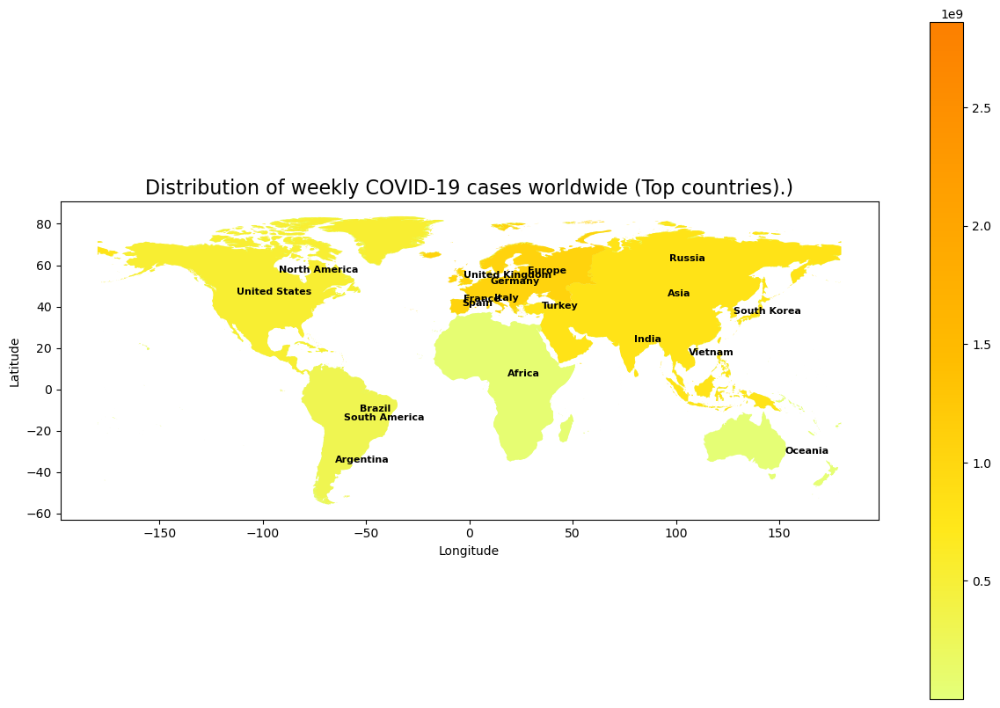

In [51]:
ax = world_cases.plot(column='Weekly Cases', cmap='Wistia', legend=True, figsize=(15, 10))

threshold = pow(10, 7.69)

for _, row in world_cases.iterrows():
    if row['Weekly Cases'] > threshold: 
        if row['geometry'] is not None:
            ax.annotate(
                text=row['Location'], 
                xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                fontsize=8,
                color='black',
                fontweight='bold'
            )
        

ax.set_title('Distribution of weekly COVID-19 cases worldwide (Top countries).)', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

In [52]:
#Total number of deaths per region.
regional_deaths = data.groupby('Location')['Weekly Deaths'].sum().reset_index()

world_deaths = world_cases.merge(regional_deaths, left_on='Location', right_on='Location', how='outer')
world_deaths.head(3)

,featurecla,scalerank,LABELRANK,SOVEREIGNT,SOV_A3,ADM0_DIF,LEVEL,TYPE,TLC,ADMIN,ADM0_A3,GEOU_DIF,GEOUNIT,GU_A3,SU_DIF,SUBUNIT,SU_A3,BRK_DIFF,NAME,NAME_LONG,BRK_A3,BRK_NAME,BRK_GROUP,ABBREV,POSTAL,FORMAL_EN,FORMAL_FR,NAME_CIAWF,NOTE_ADM0,NOTE_BRK,NAME_SORT,NAME_ALT,MAPCOLOR7,MAPCOLOR8,MAPCOLOR9,MAPCOLOR13,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,ECONOMY,INCOME_GRP,FIPS_10,ISO_A2,ISO_A2_EH,ISO_A3,ISO_A3_EH,ISO_N3,ISO_N3_EH,UN_A3,WB_A2,WB_A3,WOE_ID,WOE_ID_EH,...,NAME_JA,NAME_KO,NAME_NL,NAME_PL,NAME_PT,NAME_RU,NAME_SV,NAME_TR,NAME_UK,NAME_UR,NAME_VI,NAME_ZH,NAME_ZHT,FCLASS_ISO,TLC_DIFF,FCLASS_TLC,FCLASS_US,FCLASS_FR,FCLASS_RU,FCLASS_ES,FCLASS_CN,FCLASS_TW,FCLASS_IN,FCLASS_NP,FCLASS_PK,FCLASS_DE,FCLASS_GB,FCLASS_BR,FCLASS_IL,FCLASS_PS,FCLASS_SA,FCLASS_EG,FCLASS_MA,FCLASS_PT,FCLASS_AR,FCLASS_JP,FCLASS_KO,FCLASS_VN,FCLASS_TR,FCLASS_ID,FCLASS_PL,FCLASS_GR,FCLASS_IT,FCLASS_NL,FCLASS_SE,FCLASS_BD,FCLASS_UA,geometry,Location,Weekly Cases,CONTINENT_y,SQMI,SQKM,continent_geometry,Weekly Deaths
0,Admin-0 country,1.0,6.0,Fiji,FJI,0.0,2.0,Sovereign country,1,Fiji,FJI,0.0,Fiji,FJI,0.0,Fiji,FJI,0.0,Fiji,Fiji,FJI,Fiji,None,Fiji,FJ,Republic of Fiji,None,Fiji,None,None,Fiji,None,5.0,1.0,2.0,2.0,889953.0,11.0,2019.0,5496.0,2019.0,6. Developing region,4. Lower middle income,FJ,FJ,FJ,FJI,FJI,242,242,242,FJ,FJI,23424813.0,23424813.0,...,フィジー,피지,Fiji,Fidżi,Fiji,Фиджи,Fiji,Fiji,Фіджі,فجی,Fiji,斐济,斐濟,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"MULTIPOLYGON (((180 -16.06713, 180 -16.55522, ...",Fiji,372397.0,NaN,NaN,NaN,None,4754.0
1,Admin-0 country,1.0,3.0,United Republic of Tanzania,TZA,0.0,2.0,Sovereign country,1,United Republic of Tanzania,TZA,0.0,Tanzania,TZA,0.0,Tanzania,TZA,0.0,Tanzania,Tanzania,TZA,Tanzania,None,Tanz.,TZ,United Republic of Tanzania,None,Tanzania,None,None,Tanzania,None,3.0,6.0,2.0,2.0,58005463.0,16.0,2019.0,63177.0,2019.0,7. Least developed region,5. Low income,TZ,TZ,TZ,TZA,TZA,834,834,834,TZ,TZA,23424973.0,23424973.0,...,タンザニア,탄자니아,Tanzania,Tanzania,Tanzânia,Танзания,Tanzania,Tanzanya,Танзанія,تنزانیہ,Tanzania,坦桑尼亚,坦尚尼亞,Admin-0 country,None,Admin-0 country,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,"POLYGON ((33.90371 -0.95, 34.07262 -1.05982, 3...",Tanzania,205890.0,NaN,NaN,NaN,None,4159.0
2,Admin-0 country,1.0,7.0,Western Sahara,SAH,0.0,2.0,Indeterminate,1,Western Sahara,SAH,0.0,Western Sahara,SAH,0.0,Western Sahara,SAH,1.0,W. Sahara,Western Sahara,B28,W. Sahara,None,W. Sah.,WS,Sahrawi Arab Democratic Republic,None,Western Sahara,None,Self admin.; Claimed by Morocco,Western Sahara,None,4.0,7.0,4.0,4.0,603253.0,11.0,2017.0,907.0,2007.0,7. Least developed region,5. Low income,WI,EH,EH,ESH,ESH,732,732,732,-99,-99,23424990.0,23424990.0,...,西サハラ,서사하라,Westelijke Sahara,Sahara Zachodnia,Sara Ocidental,Западная Сахара,Västsahara,Batı Sahra,Західна Сахара,مغربی صحارا,Tây Sahara,西撒哈拉,西撒哈拉,Admin-0 dependency,None,Admin-0 dependency,None,Unrecognized,None,None,None,None,Unrecognized,None,None,None,None,None,None,Unrecognized,Unrecognized,None,Unrecognized,None,None,None,None,None,Unrecognized,Unrecognized,Unrecognized,None,None,Unrecognized,None,None,None,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",Western Sahara,NaN,NaN,NaN,NaN,None,NaN


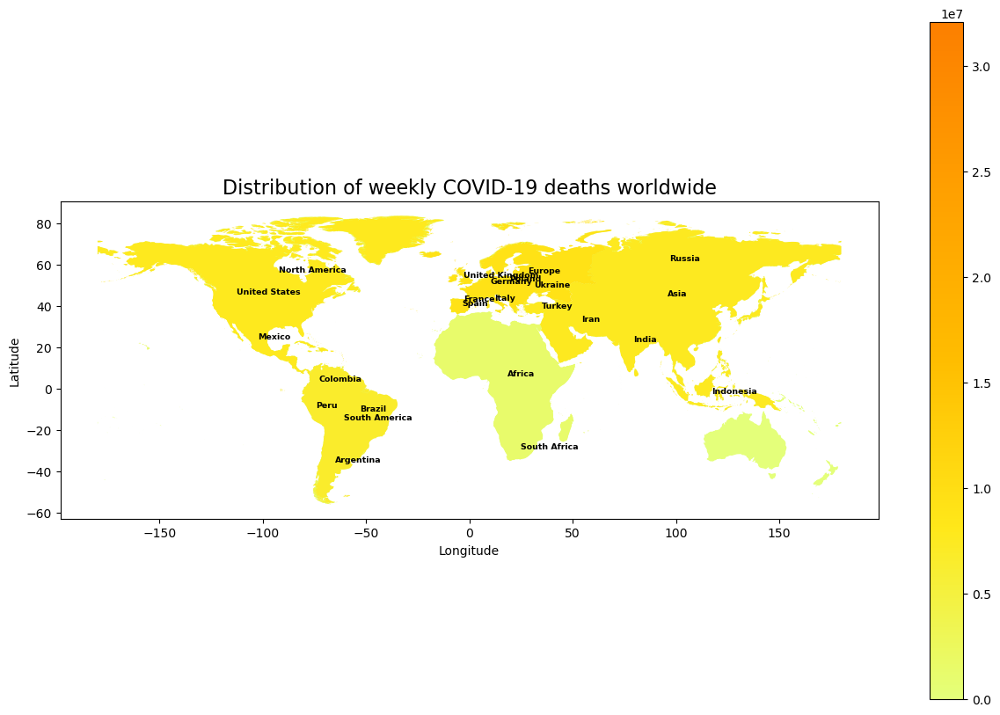

In [53]:
ax = world_deaths.plot(column='Weekly Deaths', cmap='Wistia', legend=True, figsize=(15, 10))

threshold = pow(10, 5.60)

for _, row in world_deaths.iterrows():
    if row['Weekly Deaths'] > threshold:  
        if row['geometry'] is not None:
            ax.annotate(
                text=row['Location'], 
                xy=(row['geometry'].centroid.x, row['geometry'].centroid.y),
                fontsize=6.8,
                color='black',
                fontweight='bold'
            )        

ax.set_title('Distribution of weekly COVID-19 deaths worldwide', fontsize=16)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

plt.show()

#### Vaccination and its effects

##### Comparison of weekly deaths in some regions with the highest vaccination rates

In [56]:
# The top 16 regions (or countries) with the highest vaccination rates
data_grouped_top = data.groupby(["Location"]).sum().sort_values(by = "Total Vaccinations", ascending=False).head(16)
data_grouped_top

,Id,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
Location,,,,,,,,,,,,,,,,,,,
World,343175836065,2.861184e+09,1311529,361749.577,32099475.0,4058.447,2.496880e+12,1.218746e+12,9.768278e+11,2.361440e+11,8.928484e+09,31568.98,15409.02,12350.41,2985.62,1128858.0,3.373729e+09,42.648,32062228.0
Asia,367764316423,8.042532e+08,1345872,171364.344,7623339.0,1624.324,1.687875e+12,8.131908e+11,6.406760e+11,1.433659e+11,6.305201e+09,35963.95,17326.78,13650.98,3054.77,1343473.0,2.273782e+09,48.449,7631107.0
Upper middle income,374107922156,7.087520e+08,1370119,283338.992,13535982.0,5411.303,1.159670e+12,5.135934e+11,4.360799e+11,1.257807e+11,3.953455e+09,46360.36,20532.02,17433.19,5028.34,1580471.0,1.132104e+09,45.255,13563349.0
China,374341050981,3.989379e+06,1362031,2797.793,20054.0,14.068,7.607777e+11,2.963705e+10,3.743798e+10,1.161732e+10,2.540583e+09,53354.45,2078.48,2625.60,814.74,1781743.0,4.908809e+08,34.387,18632.0
Lower middle income,367483703569,4.694772e+08,1341833,139592.556,6832004.0,2031.397,7.548071e+11,4.314895e+11,3.023138e+11,2.416828e+10,3.256393e+09,22443.17,12829.73,8988.91,718.60,968251.0,1.607126e+09,47.796,6843420.0
High income,363980741314,1.709065e+09,1351928,1376752.513,13073223.0,10531.262,5.792576e+11,2.708835e+11,2.325204e+11,8.212733e+10,1.862288e+09,46662.60,21821.33,18730.84,6615.81,1500177.0,7.227329e+08,58.212,13044838.0
India,335873742187,2.337880e+08,1242831,166094.079,2685113.0,1907.633,3.479345e+11,2.088908e+11,1.362487e+11,2.793464e+09,1.401385e+09,24718.99,14840.59,9679.71,198.44,995613.0,7.312434e+08,51.945,2750931.0
Europe,346698622651,1.063511e+09,1295347,1420561.169,9271854.0,12384.673,2.984635e+11,1.390928e+11,1.221195e+11,4.154054e+10,9.091805e+08,39866.58,18579.04,16311.82,5548.60,1214416.0,3.529631e+08,47.139,9305360.0
North America,377356288305,5.375706e+08,1372117,901487.252,7663774.0,12851.878,2.449427e+11,1.215372e+11,1.008609e+11,2.424261e+10,7.630040e+08,41076.12,20381.34,16913.89,4065.25,1279537.0,3.215156e+08,53.905,7668808.0


In [57]:
#Names of the top 16 countries with higher vaccination rates.
data_grouped_top_index = data_grouped_top.index
data_grouped_top_index
    

Index(['World', 'Asia', 'Upper middle income', 'China', 'Lower middle income',
       'High income', 'India', 'Europe', 'North America', 'European Union',
       'South America', 'United States', 'Africa', 'Brazil', 'Japan',
       'Indonesia'],
      dtype='object', name='Location')

In [58]:
#Creating a DataFrame with country names as the index
data_location_as_index = data.set_index("Location")
data_location_as_index.head(4)

,Id,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
Location,,,,,,,,,,,,,,,,,,,
World,911530868,2372.0,2020,0.300,65.0,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,344.0
World,807936902,5023.0,2020,0.635,114.0,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.0
World,773590408,5612.0,2020,0.710,116.0,0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,431.0
World,130466459,7580.0,2020,0.958,153.0,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,463.0


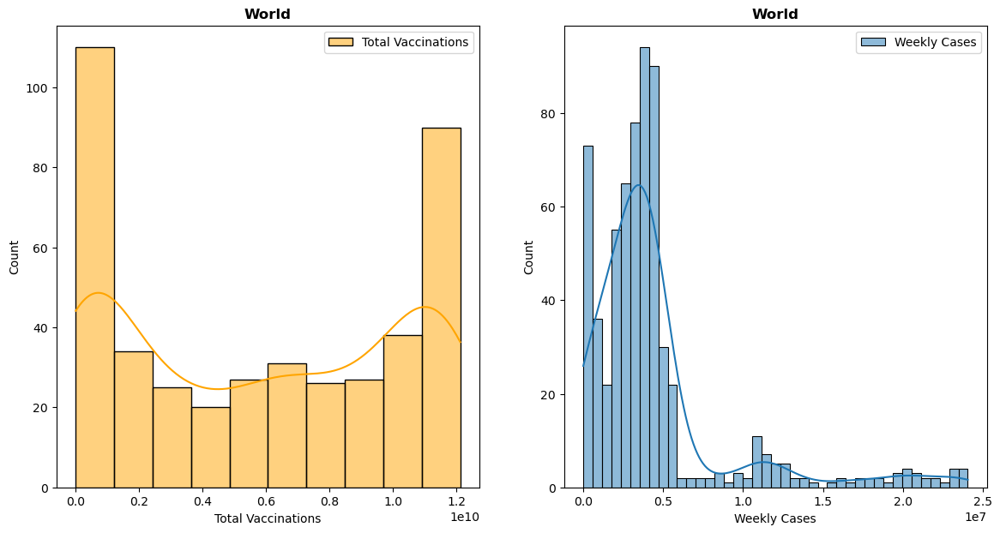

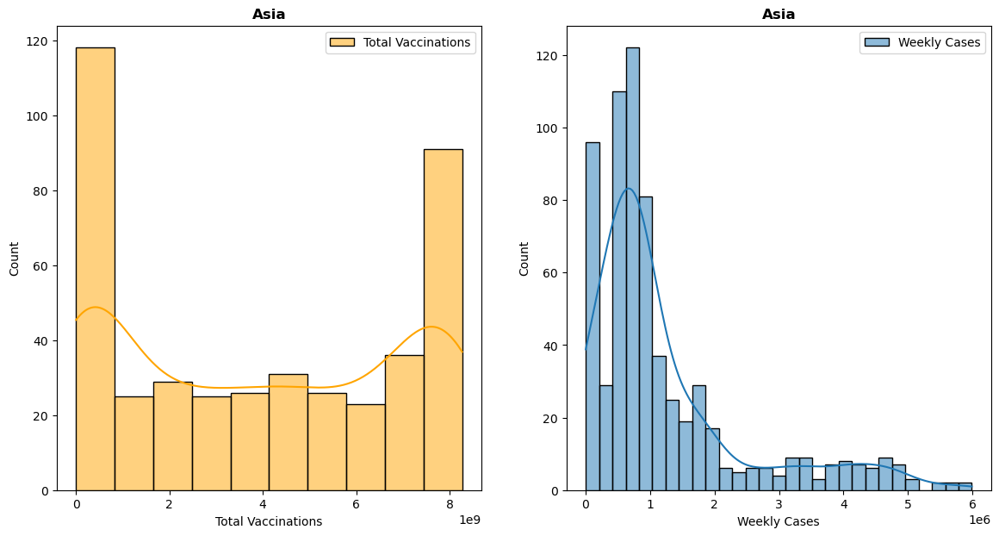

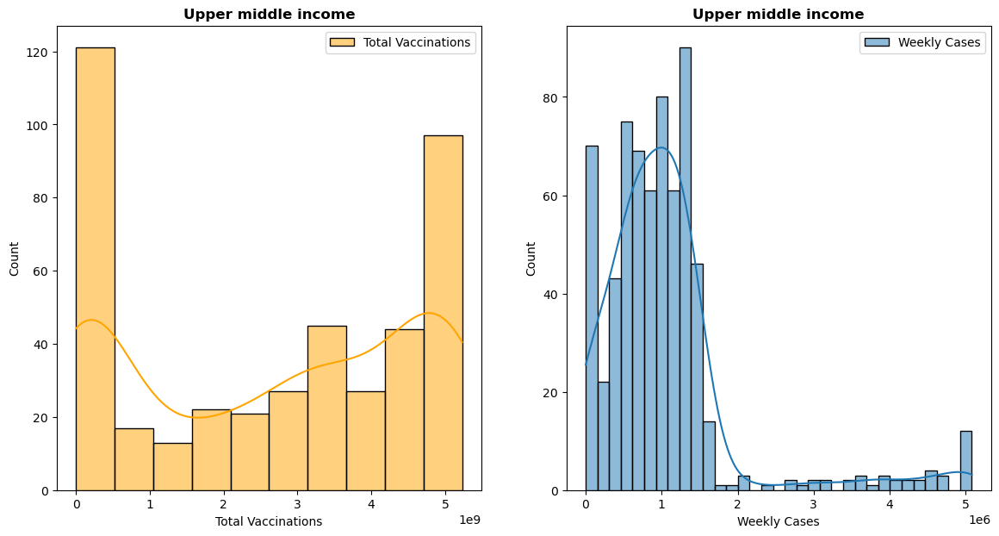

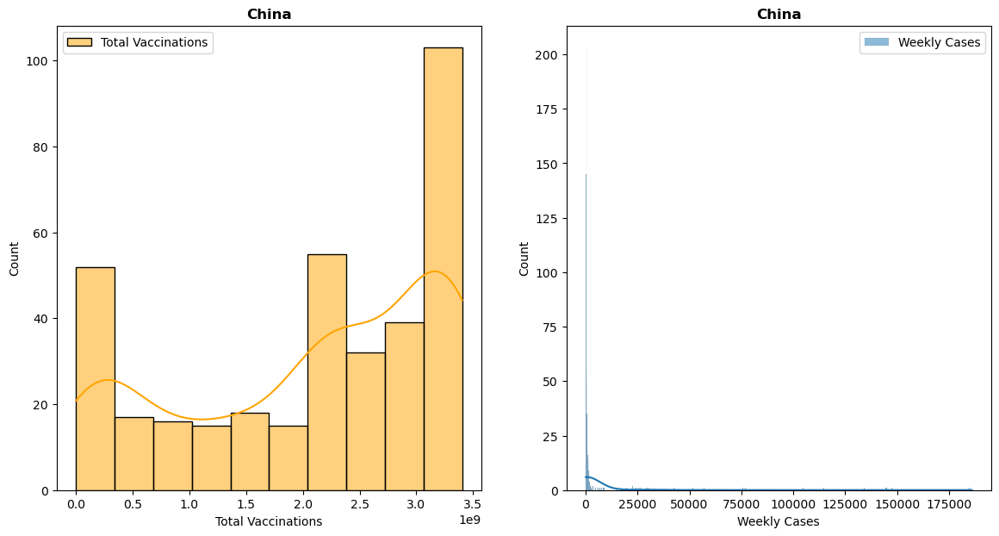

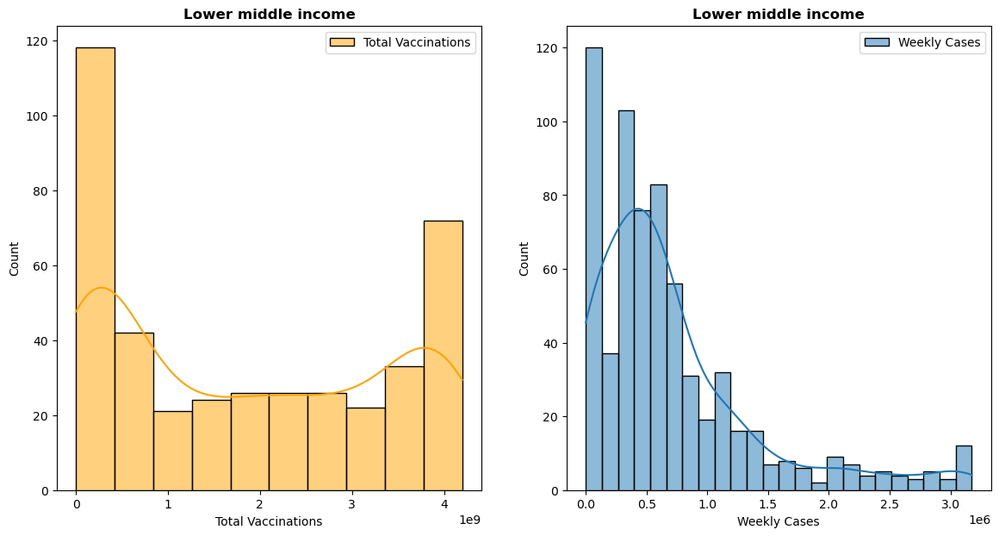

...

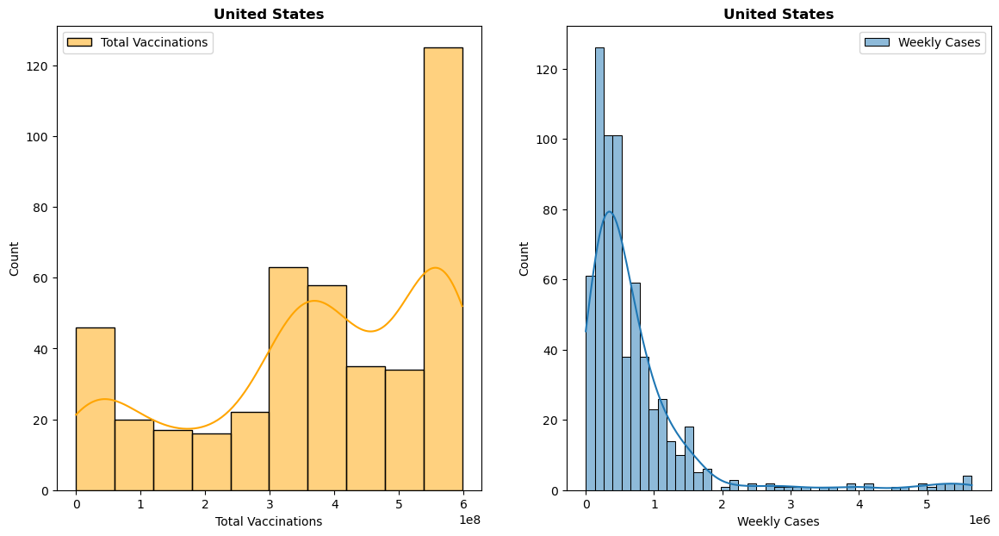

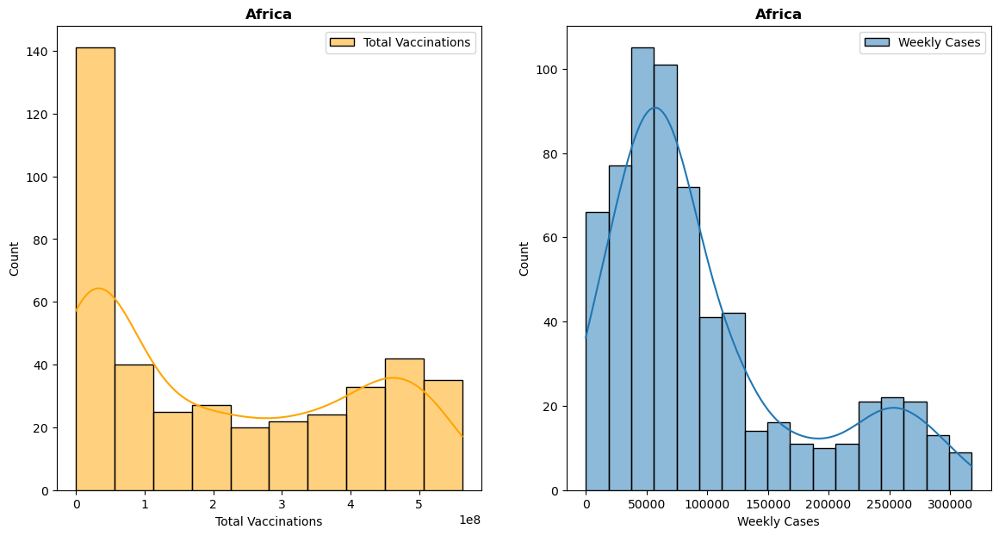

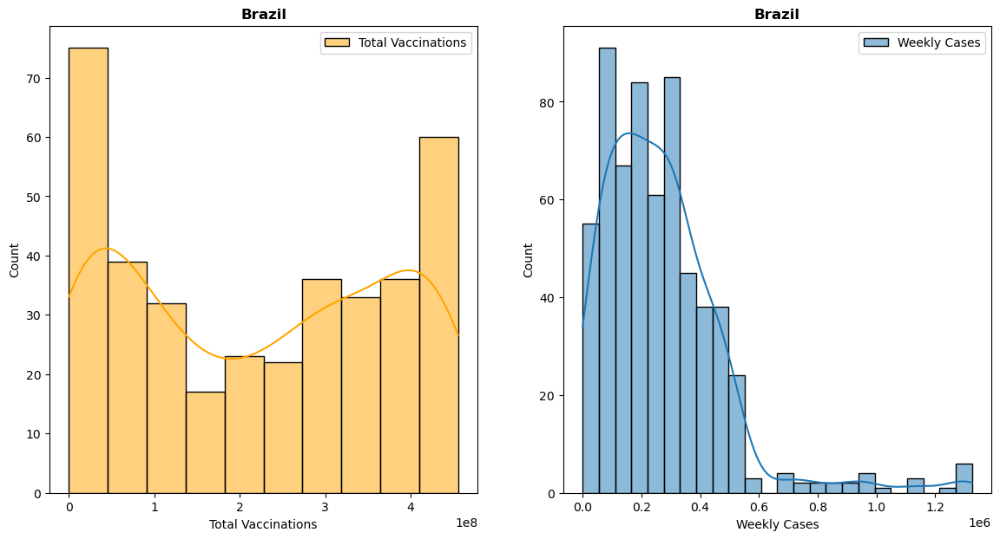

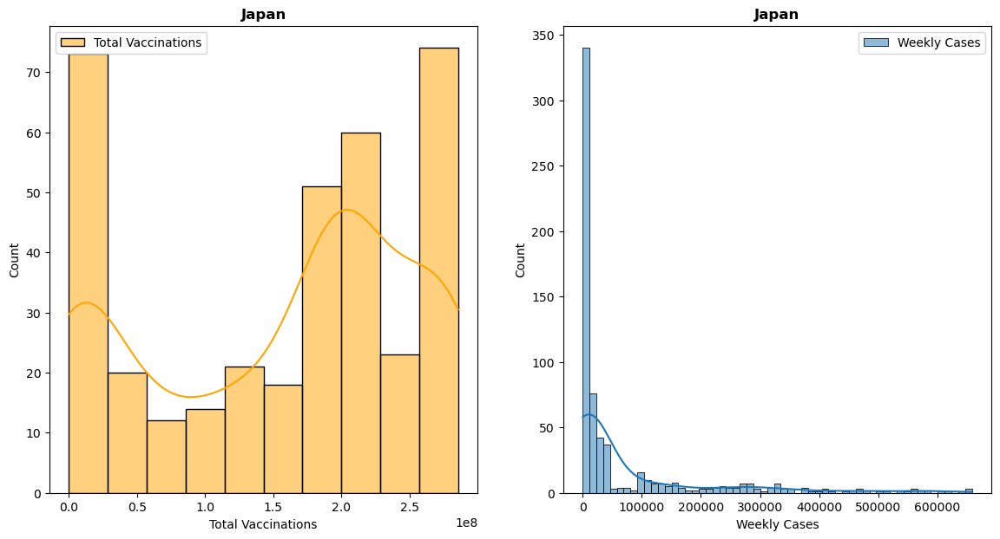

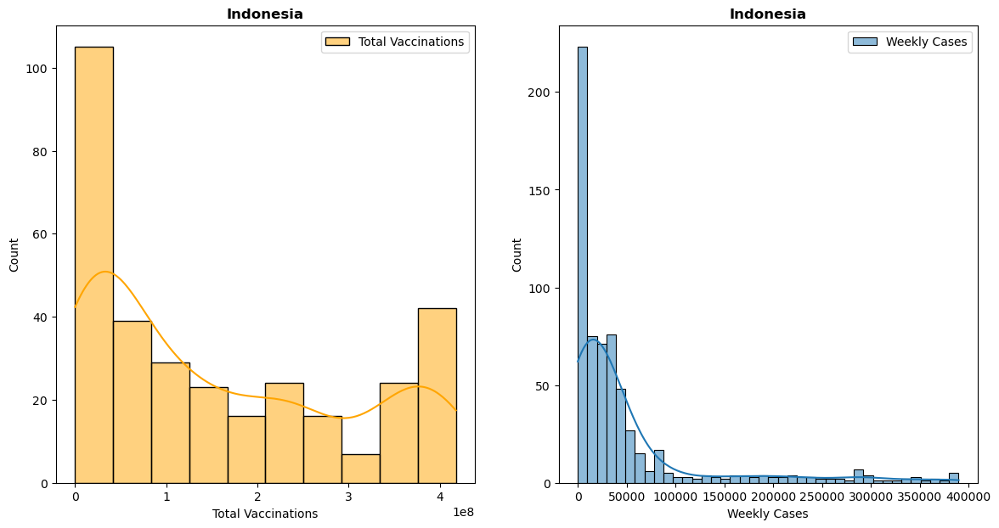

In [59]:
# Plotting the histograms of the columns 'Total Vaccinations' and 'Weekly Cases' for the top 16 countries (or regions).
for location in data_grouped_top_index:
    plt.figure(figsize=(14,7))

    plt.subplot(1, 2, 1)
    sns.histplot(data_location_as_index["Total Vaccinations"][location], label='Total Vaccinations', kde=True, color='orange')
    plt.title(f'{location}', fontweight='bold')
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.histplot(data_location_as_index["Weekly Cases"][location], label='Weekly Cases', kde=True)
    plt.title(f'{location}', fontweight='bold')
    plt.legend()

    
    plt.show()


In [60]:
#Investigation of the relationship between 'Total Vaccinations' and 'Weekly Cases'
from scipy.stats import pearsonr

df_clean = data.dropna(subset=['Weekly Cases', 'Weekly Deaths', 'Total Vaccinations'])

# Analyser der Korrelation zwischen Impfungen und Krankheitsfällen
corr_cases, _ = pearsonr(df_clean['Total Vaccinations'], df_clean['Weekly Cases'])
corr_deaths, _ = pearsonr(df_clean['Total Vaccinations'], df_clean['Weekly Deaths'])


print(f"Korrelation zwischen Total Vaccinations und Weekly Cases : {corr_cases}")
print(f"Korrelation zwischen Total Vaccinations und Weekly Deaths  : {corr_deaths}")

Korrelation zwischen Total Vaccinations und Weekly Cases : 0.5945225142453268
Korrelation zwischen Total Vaccinations und Weekly Deaths  : 0.42208650052500496



**The analysis shows for some countries that:**

The increase in **Total Vaccinations** is not directly correlated with a **significant reduction in weekly cases**. For example, this is the case between **Europe (Total Vaccinations: 2.984635e+11, Weekly Cases: 1.063511e+09)** and **North America (Total Vaccinations: 2.449427e+11, Weekly Cases: 5.375706e+08)**. **Europe** has a higher total number of vaccinations than **North America**, but at the same time, it has **more cases of illness than North America**, which has a lower vaccination rate.
This is also the case with some other regions, such as  **World and Asia**, **upper-middle-income and China**, etc.

**NOTE: ONE CANNOT CONCLUDE FROM JUST A FEW COUNTRIES THAT THE OVERALL INCREASE IN VACCINATION RATE DOES NOT LEAD TO A REDUCTION IN WEEKLY CASES. THE HYPOTHESIS TEST LATER WILL PROVIDE US WITH MORE INSIGHT.**

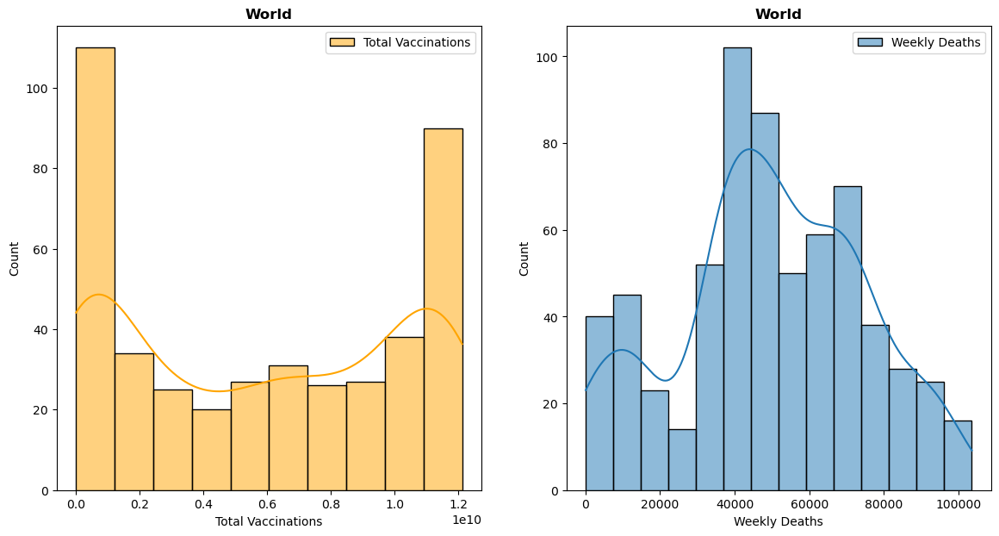

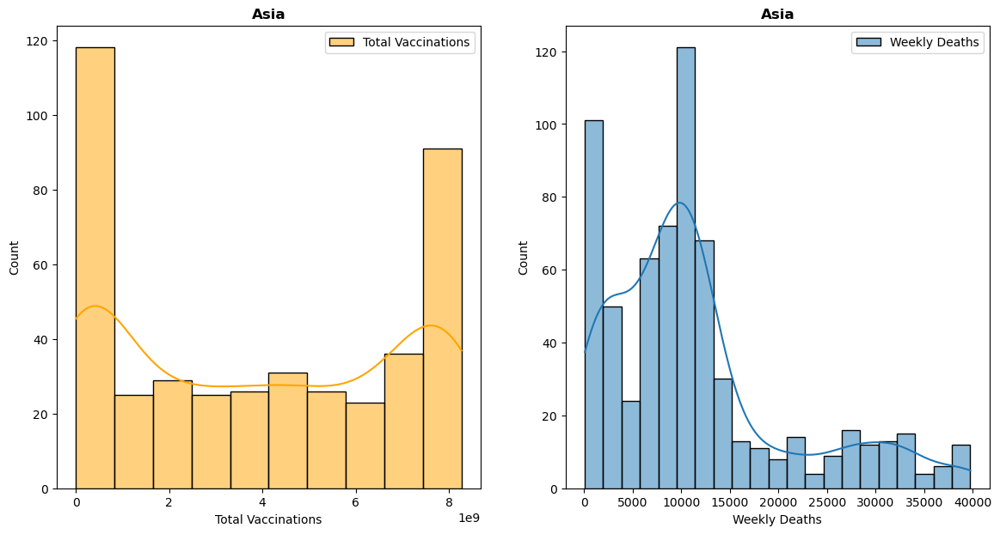

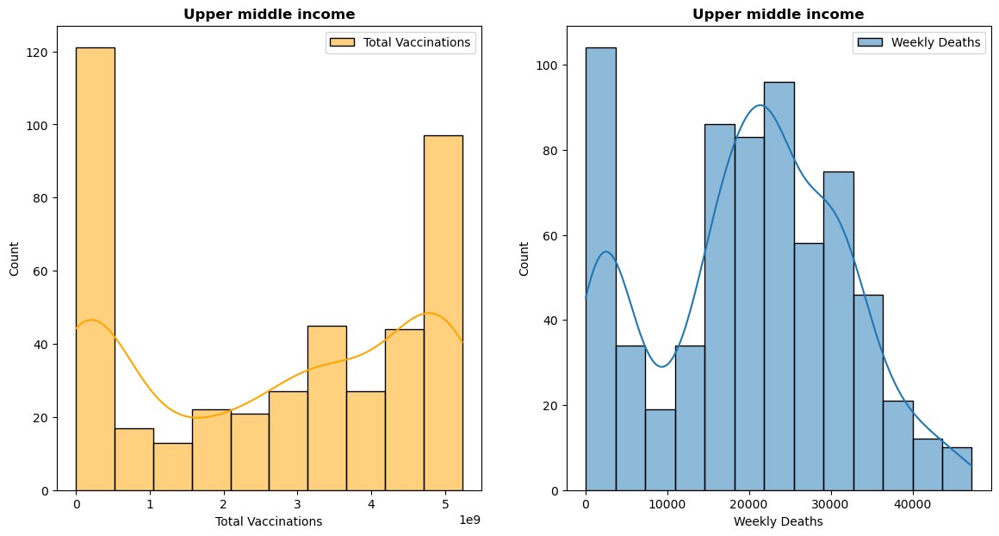

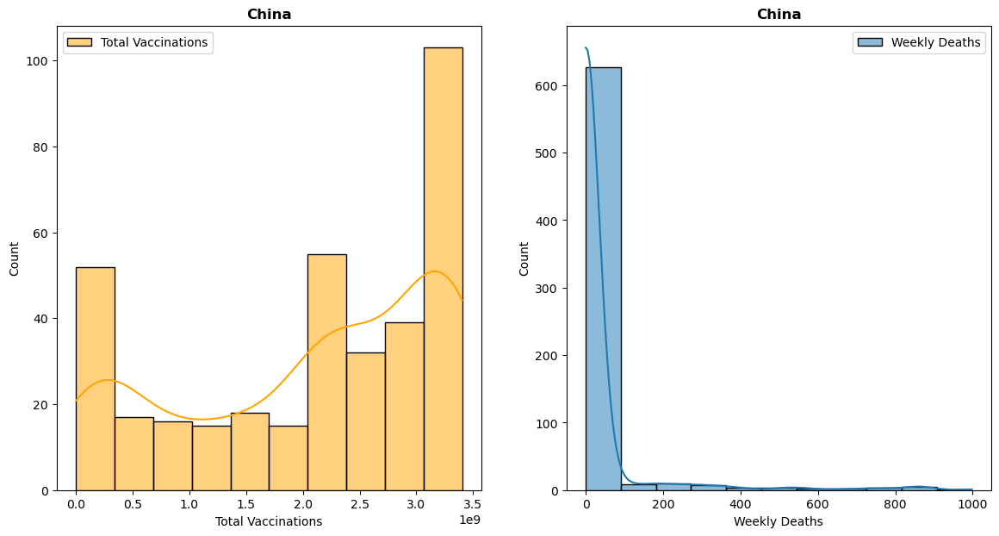

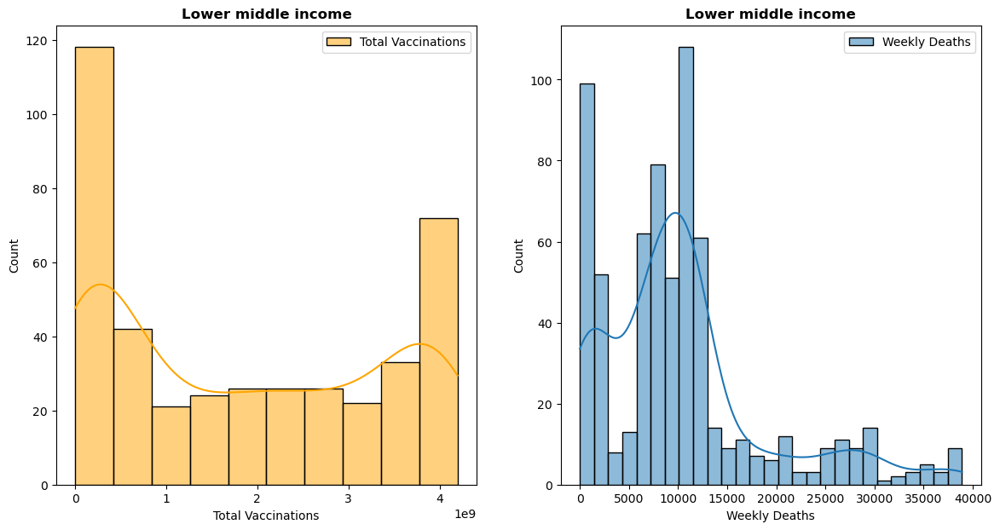

...

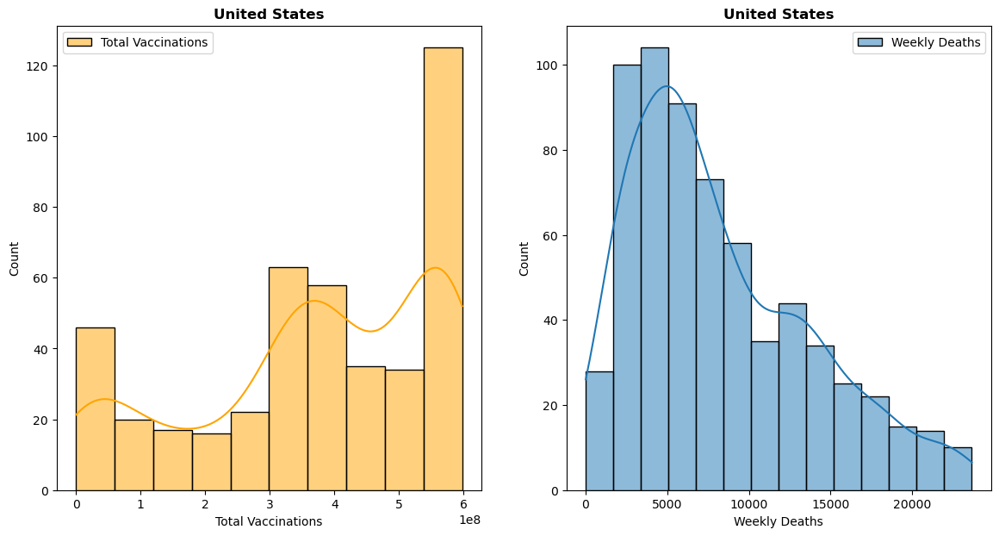

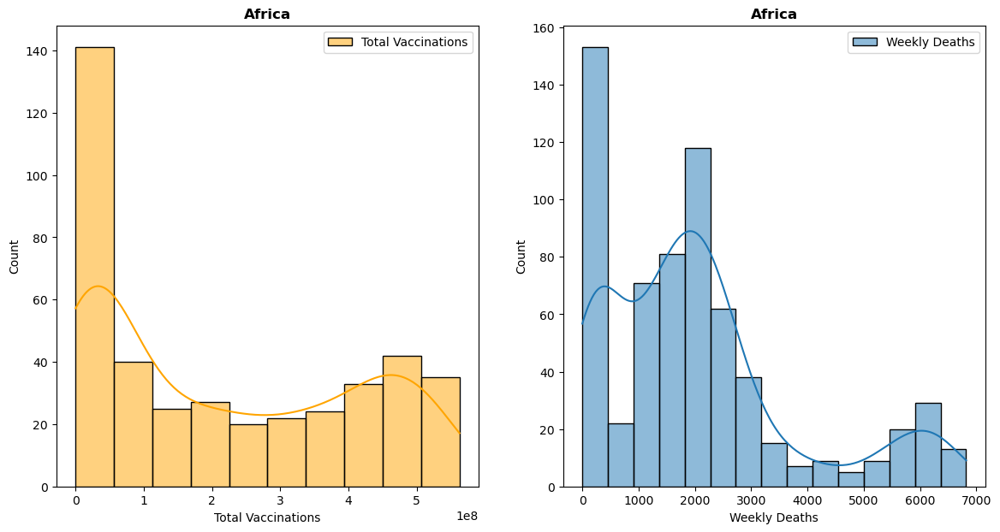

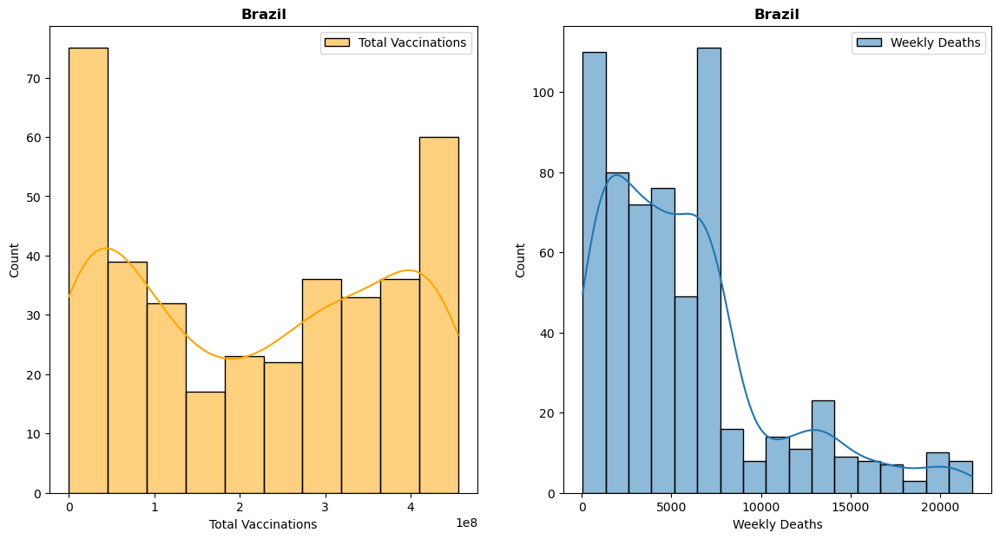

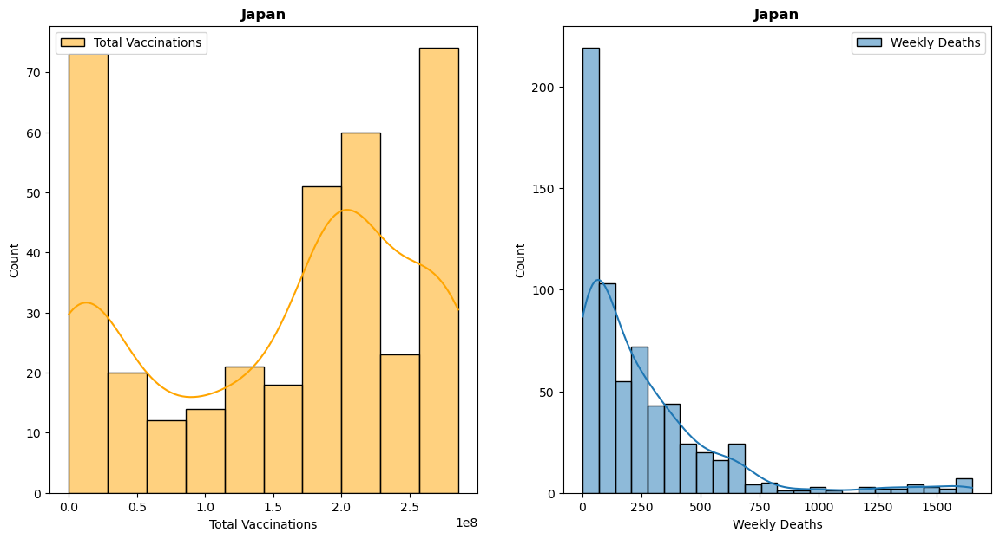

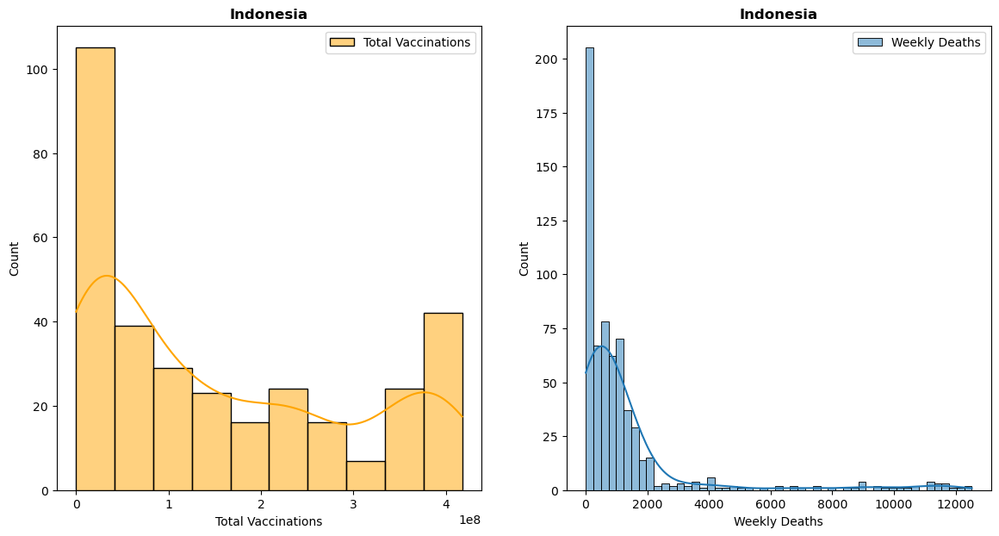

In [62]:
# Plot of the histograms of the 'Total Vaccinations' and 'Weekly Deaths' columns for the top 16 countries (or regions).
for location in data_grouped_top_index:
    plt.figure(figsize=(14,7))

    plt.subplot(1, 2, 1)
    sns.histplot(data_location_as_index["Total Vaccinations"][location], label='Total Vaccinations', kde=True, color='orange')
    plt.title(f'{location}', fontweight='bold')
    plt.legend()

    plt.subplot(1, 2, 2)
    sns.histplot(data_location_as_index["Weekly Deaths"][location], label='Weekly Deaths', kde=True)
    plt.title(f'{location}', fontweight='bold')
    plt.legend()

    
    plt.show()

**Here, the analysis also shows for some countries that:**

- The increase in **total vaccinations** does not directly correlate with a **significant reduction in weekly death numbers**. For example, this is the case between **Upper middle income (total vaccinations: 1.159670e+12, total weekly deaths: 13,535,982.0) and China (total vaccinations: 7.607777e+11, total weekly deaths: 20,054.0)**. **Upper middle income** has a higher total number of vaccinations than **China**, but at the same time, it has a **higher number of deaths than China**, which has a lower vaccination rate.
This is also the case with some other regions, such as **Europe and North America**, **South America and the United States**, **Japan and Brazil**, etc.

**NOTE: ONE CANNOT CONCLUDE FROM A FEW COUNTRIES THAT THE OVERALL INCREASE IN VACCINATION RATES DOES NOT LEAD TO A REDUCTION IN WEEKLY DEATHS. THE HYPOTHESIS TEST LATER WILL PROVIDE MORE INSIGHT.**

## I-III. Hypotheses to be tested:

- **Hypothesis 1: Do regions with higher vaccination rates have lower weekly death rates?**
  - **Formulation: Null hypothesis (H0): There is no significant monotonic relationship between vaccination rates and weekly deaths.**
- **Hypothesis 2: Do regions with higher COVID-19 case numbers have higher death rates?**
  - **Formulation: Null hypothesis (H0): There is no significant monotonic relationship between COVID-19 case numbers and weekly deaths or deaths in the following week(Next Week's Deaths)**
- **Hypothesis 3: Do regions with higher weekly death rates have higher death rates in the following week?**
  - **Formulation: Null hypothesis (H0): There is no significant monotonic relationship between weekly death rates and death rates in the following week.**
**ETC....**

#### Test preparation and test functions

In [67]:
def hypo_preprocessing(data, column_names, year=2021, percentage=0.20):
  
    # Dictionaries for storing the prepared data
    top_laender_dict = {}
    down_laender_dict = {}
    top_down_laender_dict = {}
    
    for column_name in column_names:
        # Extraction of data for the specified year
        data_year = data[data['Year'] == year]
        
        # Calculation of the number of regions (percentage of regions)
        n = int(len(data_year["Location"].unique()) * percentage)
        
        # Top and bottom regions for the given column
        data_year_down = data_year.groupby("Location").sum().nsmallest(n, column_name)
        data_year_top = data_year.groupby("Location").sum().nlargest(n, column_name)
        
        # Extracting the rows for the top and bottom regions
        data_down = data.loc[(data["Location"].isin(data_year_down.index)) & (data["Year"] == year)]
        data_top = data.loc[(data["Location"].isin(data_year_top.index)) & (data["Year"] == year)]
        
        # Cleaning and creating a combined DataFrame
        data_down = data_down.dropna(axis=0, subset=["Weekly Cases", "Weekly Deaths", "Next Week's Deaths", column_name])
        data_top = data_top.dropna(axis=0, subset=["Weekly Cases", "Weekly Deaths", "Next Week's Deaths", column_name])
        data_top_down = pd.concat([data_down, data_top], ignore_index=True)

        #Balancing the two DataFrames
        if data_top.shape[0] > data_down.shape[0] : 
            data_top = data_top.sample(data_down.shape[0])
        else : 
            data_down = data_down.sample(data_top.shape[0])

        
        # storing in dictionaries
        top_laender_dict[column_name] = data_top
        down_laender_dict[column_name] = data_down
        top_down_laender_dict[column_name] = data_top_down
        
        print(f'\n\n***** {column_name.upper()} *****\n')
        print(f'data_top contains now : {data_top.shape[0]} lines et {data_top.shape[1]} columns')
        print(f'data_down contains now : {data_down.shape[0]} lines et {data_down.shape[1]} columns \n')
        print(f'TOP {len(data_year_top.index)} REGION WITH HIGHER NUMBER OF {column_name.upper()} IN {year}:\n\n{data_year_top.index}\n')
        print(f'BOTTOM {len(data_year_down.index)} REGION WITH HIGHER NUMBER OF {column_name.upper()} IN {year}:\n\n{data_year_down.index}')
    
    return top_laender_dict, down_laender_dict, top_down_laender_dict


In [68]:
# Definition of T-Test function
from scipy.stats import ttest_ind

def ttest1(columns, hypothese_columns, groupe_1_dict, groupe_2_dict, year=2021):
    alpha = 0.05
    for hypo_col in hypothese_columns: 
        print(f"\n\n NULL HYPOTHESIS (H0): THERE IS NO SIGNIFICANT DIFFERENCE IN THE MEAN OF THE VARIABLE BETWEEN THE GROUPS WITH HIGH AND LOW '{hypo_col.upper()}' ({year}) \n\n ")
        for col in columns:
            stat, p = ttest_ind(groupe_1_dict[hypo_col][col], groupe_2_dict[hypo_col][col])
            if p < alpha : 
                print(f'{col :-<70} H0 REJECTED\n')
            else: print(f'{col :-<70} H0 RETAINED')


In [69]:
# Definition of Spearman test function
from scipy.stats import ttest_ind

def spearmantest(columns, hypothese_columns, groupe_dict, year="totaldata"):
    alpha = 0.05
    for hypo_col in hypothese_columns: 
        print(f"\n\n H0 HYPOTHESIS: THERE IS NO SIGNIFICANT MONOTONIC RELATIONSHIP BETWEEN '{hypo_col.upper()}' AND THE OTHER VARIABLES ({year}) \n\n ")
        for col in columns:
            if col != hypo_col:
                coef, p = spearmanr(groupe_dict[hypo_col][hypo_col], groupe_dict[hypo_col][col])
                if p < alpha:
                    print(f'{hypo_col} und {col :-<70} H0 REJECTED (coef={coef:.3f}, p={p:.3f})\n')
                else:
                    print(f' {hypo_col} und {col :-<70} H0 RETAINED (coef={coef:.3f}, p={p:.3f})\n')

        print("\n\n****************************************************************************************************")

#### Application of Tests to the 2020 data

In [71]:
#Call of hypo_preprocessing for the 2020 data
column_names = ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"]
data_top_dict_2020, data_down_dict_2020, data_top_down_dict_2020 = hypo_preprocessing(data, column_names, year=2020)

data_top_down_dict_2020['Weekly Deaths'].head()



***** TOTAL VACCINATIONS *****

data_top contains now : 2 lines et 20 columns
data_down contains now : 2 lines et 20 columns 

TOP 40 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2020:

Index(['High income', 'World', 'Asia', 'United States', 'Upper middle income',
       'North America', 'China', 'Israel', 'European Union', 'Europe',
       'Germany', 'Canada', 'Bahrain', 'South America', 'Russia', 'Denmark',
       'Italy', 'Mexico', 'Poland', 'Argentina', 'Slovenia', 'Lithuania',
       'Switzerland', 'Romania', 'Oman', 'Chile', 'Czechia', 'Estonia',
       'Norway', 'France', 'Latvia', 'Greece', 'Luxembourg', 'Kuwait',
       'Bulgaria', 'Ireland', 'Hungary', 'Belgium', 'Singapore',
       'Afghanistan'],
      dtype='object', name='Location')

BOTTOM 40 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2020:

Index(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Armenia', 'Aruba', 'Australia', 'Austria',
       'Azerbaija

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,322402222,Antigua and Barbuda,6.0,2020,64.364,2.0,21.455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
1,572578633,Antigua and Barbuda,8.0,2020,85.818,2.0,21.455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2,852095863,Antigua and Barbuda,4.0,2020,42.909,1.0,10.727,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
3,649506512,Antigua and Barbuda,4.0,2020,42.909,0.0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
4,949219283,Antigua and Barbuda,4.0,2020,42.909,1.0,10.727,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [72]:
#application of  T-Tests for 2020
ttest1(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_dict_2020, data_down_dict_2020, year=2020)



 NULL HYPOTHESIS (H0): THERE IS NO SIGNIFICANT DIFFERENCE IN THE MEAN OF THE VARIABLE BETWEEN THE GROUPS WITH HIGH AND LOW 'TOTAL VACCINATIONS' (2020) 

 
Weekly Cases---------------------------------------------------------- H0 RETAINED
Year------------------------------------------------------------------ H0 RETAINED
Weekly Cases per Million---------------------------------------------- H0 RETAINED
Weekly Deaths--------------------------------------------------------- H0 RETAINED
Weekly Deaths per Million--------------------------------------------- H0 RETAINED
Total Vaccinations---------------------------------------------------- H0 REJECTED

People Vaccinated----------------------------------------------------- H0 REJECTED

People Fully Vaccinated----------------------------------------------- H0 RETAINED
Total Boosters-------------------------------------------------------- H0 RETAINED
Daily Vaccinations---------------------------------------------------- H0 RETAINED
Total Vacci

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


**FOR 2020:**

According to the **t-test**, there is a significant difference between countries with high and low weekly COVID-19 cases(Weekly Cases) concerning "**Weekly Deaths**" and "**Next Week's Deaths.**" This difference is not random. It suggests an association between weekly COVID-19 cases and these variables. However, this analysis alone does not allow a conclusion about a causal relationship. An increase in weekly COVID-19 cases may be associated with an increase in weekly deaths, but further analyses would be required to confirm a direct effect.**

In [74]:
#Application of Spearmann-Tests for 2020,
from scipy.stats import spearmanr
spearmantest(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_down_dict_2020, year="2020")



 H0 HYPOTHESIS: THERE IS NO SIGNIFICANT MONOTONIC RELATIONSHIP BETWEEN 'TOTAL VACCINATIONS' AND THE OTHER VARIABLES (2020) 

 
Total Vaccinations und Weekly Cases---------------------------------------------------------- H0 REJECTED (coef=0.315, p=0.000)

 Total Vaccinations und Year------------------------------------------------------------------ H0 RETAINED (coef=nan, p=nan)

 Total Vaccinations und Weekly Cases per Million---------------------------------------------- H0 RETAINED (coef=-0.089, p=0.131)

Total Vaccinations und Weekly Deaths--------------------------------------------------------- H0 REJECTED (coef=0.250, p=0.000)

Total Vaccinations und Weekly Deaths per Million--------------------------------------------- H0 REJECTED (coef=-0.167, p=0.004)

 Total Vaccinations und People Vaccinated----------------------------------------------------- H0 RETAINED (coef=nan, p=nan)

 Total Vaccinations und People Fully Vaccinated----------------------------------------------- H0 RE

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


**2020**

The **Spearman tests** show significant monotonic correlations between certain variables, particularly between **Total Vaccinations and Total Vaccinations per Hundred**; **weekly deaths and next week's deaths**. The strongest relationships are observed between **"Weekly Deaths und Next Week's Deaths" (coef = 0.974)**. However, other variables, such as those related to **vaccinated people and boosters**, do not show a significant monotonic relationship with the other data.

#### Application of tests to the 2021 data

In [77]:
#Call of hypo_preprocessing for the 2021 data
column_names = ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"]
data_top_dict_2021, data_down_dict_2021, data_top_down_dict_2021 = hypo_preprocessing(data, column_names, year=2021)

data_top_down_dict_2021['Weekly Deaths'].head()



***** TOTAL VACCINATIONS *****

data_top contains now : 1033 lines et 20 columns
data_down contains now : 1033 lines et 20 columns 

TOP 43 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2021:

Index(['World', 'Asia', 'Upper middle income', 'China', 'Lower middle income',
       'High income', 'Europe', 'India', 'North America', 'European Union',
       'United States', 'South America', 'Brazil', 'Indonesia', 'Japan',
       'Africa', 'Germany', 'United Kingdom', 'Turkey', 'France', 'Russia',
       'Italy', 'Mexico', 'Canada', 'South Korea', 'Argentina', 'Spain',
       'Thailand', 'Vietnam', 'Saudi Arabia', 'Chile', 'Malaysia', 'Poland',
       'Pakistan', 'Oceania', 'Colombia', 'Philippines', 'Bangladesh', 'Peru',
       'Low income', 'Australia', 'Cambodia', 'Sri Lanka'],
      dtype='object', name='Location')

BOTTOM 43 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2021:

Index(['Eritrea', 'International', 'Bonaire Sint Eustatius and Saba',
       'Burundi', 'Montserrat

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,955039050,Andorra,361.0,2021,4567.654,1.0,12.653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,193148502,Andorra,360.0,2021,4555.002,1.0,12.653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
2,363805587,Andorra,371.0,2021,4694.182,1.0,12.653,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0
3,210086497,Andorra,389.0,2021,4921.932,0.0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0
4,733229232,Andorra,365.0,2021,4618.266,0.0,0.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0


In [78]:
#Application of T-Tests for 2021
ttest1(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_dict_2021, data_down_dict_2021, year=2021)



 NULL HYPOTHESIS (H0): THERE IS NO SIGNIFICANT DIFFERENCE IN THE MEAN OF THE VARIABLE BETWEEN THE GROUPS WITH HIGH AND LOW 'TOTAL VACCINATIONS' (2021) 

 
Weekly Cases---------------------------------------------------------- H0 REJECTED

Year------------------------------------------------------------------ H0 RETAINED
Weekly Cases per Million---------------------------------------------- H0 RETAINED
Weekly Deaths--------------------------------------------------------- H0 REJECTED

Weekly Deaths per Million--------------------------------------------- H0 RETAINED
Total Vaccinations---------------------------------------------------- H0 REJECTED

People Vaccinated----------------------------------------------------- H0 RETAINED
People Fully Vaccinated----------------------------------------------- H0 RETAINED
Total Boosters-------------------------------------------------------- H0 RETAINED
Daily Vaccinations---------------------------------------------------- H0 RETAINED
Total Vacc

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


**2021 :**

According to the **t-test**, there is a **significant difference between countries with high and low vaccination rates** concerning "**weekly cases**," "**weekly deaths**," "**total vaccinations per hundred**," and "**next week's deaths**." This difference is not random. It suggests an association between the vaccination rate and these variables. However, this analysis alone does not allow for a conclusion about a causal relationship. An increase in the vaccination rate may be associated with a reduction in weekly deaths, but further analyses would be needed to confirm a direct effect.

In [80]:
#Application of Spearmann-Tests for 2021,
from scipy.stats import spearmanr
spearmantest(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_down_dict_2021, year="2021")



 H0 HYPOTHESIS: THERE IS NO SIGNIFICANT MONOTONIC RELATIONSHIP BETWEEN 'TOTAL VACCINATIONS' AND THE OTHER VARIABLES (2021) 

 
Total Vaccinations und Weekly Cases---------------------------------------------------------- H0 REJECTED (coef=0.612, p=0.000)

 Total Vaccinations und Year------------------------------------------------------------------ H0 RETAINED (coef=nan, p=nan)

Total Vaccinations und Weekly Cases per Million---------------------------------------------- H0 REJECTED (coef=0.131, p=0.000)

Total Vaccinations und Weekly Deaths--------------------------------------------------------- H0 REJECTED (coef=0.543, p=0.000)

Total Vaccinations und Weekly Deaths per Million--------------------------------------------- H0 REJECTED (coef=0.128, p=0.000)

 Total Vaccinations und People Vaccinated----------------------------------------------------- H0 RETAINED (coef=nan, p=nan)

 Total Vaccinations und People Fully Vaccinated----------------------------------------------- H0 RETAI

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


**2021**

The results of the **Spearman tests** reveal several significant relationships between the variables. The null hypotheses (H0) are rejected for several variable pairings, indicating **significant monotonic correlations**. For example, there is a strong **positive correlation** between **"Weekly Deaths" and "Weekly Cases" (coef = 0.936)** as well as between **"Weekly Deaths" and "Next Week's Deaths" (coef = 0.962), both with very low p-values (0.000)**. However, other variables, particularly those **related to vaccinations and data per million**, show **no significant relationships with weekly deaths or cases**, as evidenced by the **lack of valid values for these tests (coef = nan, p = nan)**. In summary, the **strongest correlations** are observed between **weekly deaths and next week's deaths**, while the **vaccination variables** appear to have no significant monotonic influence on these variables.

#### Application of tests to the 2022 Data

In [83]:
#Call of hypo_preprocessing for the 2022 data
column_names = ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"]
data_top_dict_2022, data_down_dict_2022, data_top_down_dict_2022 = hypo_preprocessing(data, column_names, year=2022)

data_top_down_dict_2022['Weekly Deaths'].head()



***** TOTAL VACCINATIONS *****

data_top contains now : 439 lines et 20 columns
data_down contains now : 439 lines et 20 columns 

TOP 44 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2022:

Index(['World', 'Asia', 'Upper middle income', 'Lower middle income', 'China',
       'High income', 'India', 'Europe', 'North America', 'European Union',
       'South America', 'United States', 'Africa', 'Brazil', 'Japan',
       'Indonesia', 'Germany', 'France', 'United Kingdom', 'Low income',
       'Vietnam', 'Pakistan', 'Italy', 'Thailand', 'Turkey', 'South Korea',
       'Russia', 'Bangladesh', 'Argentina', 'Mexico', 'Canada', 'Iran',
       'Oceania', 'Peru', 'Malaysia', 'Chile', 'Australia', 'Poland', 'Taiwan',
       'Philippines', 'Cuba', 'Ecuador', 'Colombia', 'Spain'],
      dtype='object', name='Location')

BOTTOM 44 REGION WITH HIGHER NUMBER OF TOTAL VACCINATIONS IN 2022:

Index(['Bonaire Sint Eustatius and Saba', 'Cook Islands', 'Eritrea',
       'International', 'Monaco', 'N

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,984724956,Andorra,2010.0,2022,25432.093,1.0,12.653,NaN,NaN,NaN,NaN,758.0,NaN,NaN,NaN,NaN,9591.0,27.0,0.034,1.0
1,888965535,Andorra,2170.0,2022,27456.538,1.0,12.653,NaN,NaN,NaN,NaN,865.0,NaN,NaN,NaN,NaN,10945.0,27.0,0.034,1.0
2,240962892,Andorra,2466.0,2022,31201.761,1.0,12.653,NaN,NaN,NaN,NaN,865.0,NaN,NaN,NaN,NaN,10945.0,27.0,0.034,0.0
3,253613407,Andorra,2167.0,2022,27418.579,1.0,12.653,NaN,NaN,NaN,NaN,865.0,NaN,NaN,NaN,NaN,10945.0,27.0,0.034,0.0
4,263432761,Andorra,2668.0,2022,33757.623,1.0,12.653,NaN,NaN,NaN,NaN,865.0,NaN,NaN,NaN,NaN,10945.0,27.0,0.034,1.0


In [84]:
#Application of T-Tests for 2022
ttest1(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_dict_2022, data_down_dict_2022, year=2022)



 NULL HYPOTHESIS (H0): THERE IS NO SIGNIFICANT DIFFERENCE IN THE MEAN OF THE VARIABLE BETWEEN THE GROUPS WITH HIGH AND LOW 'TOTAL VACCINATIONS' (2022) 

 
Weekly Cases---------------------------------------------------------- H0 REJECTED

Year------------------------------------------------------------------ H0 RETAINED
Weekly Cases per Million---------------------------------------------- H0 REJECTED

Weekly Deaths--------------------------------------------------------- H0 REJECTED

Weekly Deaths per Million--------------------------------------------- H0 REJECTED

Total Vaccinations---------------------------------------------------- H0 REJECTED

People Vaccinated----------------------------------------------------- H0 RETAINED
People Fully Vaccinated----------------------------------------------- H0 RETAINED
Total Boosters-------------------------------------------------------- H0 RETAINED
Daily Vaccinations---------------------------------------------------- H0 REJECTED

Total V

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_axis_nan_policy.py:523: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [85]:
#Application of Spearmann-Tests for 2022,
from scipy.stats import spearmanr
spearmantest(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_down_dict_2022, year="2022")



 H0 HYPOTHESIS: THERE IS NO SIGNIFICANT MONOTONIC RELATIONSHIP BETWEEN 'TOTAL VACCINATIONS' AND THE OTHER VARIABLES (2022) 

 
Total Vaccinations und Weekly Cases---------------------------------------------------------- H0 REJECTED (coef=0.603, p=0.000)

 Total Vaccinations und Year------------------------------------------------------------------ H0 RETAINED (coef=nan, p=nan)

Total Vaccinations und Weekly Cases per Million---------------------------------------------- H0 REJECTED (coef=-0.168, p=0.000)

Total Vaccinations und Weekly Deaths--------------------------------------------------------- H0 REJECTED (coef=0.648, p=0.000)

Total Vaccinations und Weekly Deaths per Million--------------------------------------------- H0 REJECTED (coef=-0.071, p=0.000)

 Total Vaccinations und People Vaccinated----------------------------------------------------- H0 RETAINED (coef=nan, p=nan)

 Total Vaccinations und People Fully Vaccinated----------------------------------------------- H0 RET

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


#### Application of the Spearman test to the entire cleaned dataset (2020–2022)

In [87]:
data_cleaned = data.dropna(axis=0)
data_cleaned.head()

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
241,275164452,World,4174523.0,2020,527.800,77527.0,9.802,11875406.0,7231498.0,44680.0,1.0,897447.0,0.15,0.09,0.00,0.0,113.0,690726.0,0.009,81042.0
242,857254713,World,4424216.0,2021,559.369,79456.0,10.046,13722790.0,9050886.0,58460.0,9.0,1079269.0,0.17,0.11,0.00,0.0,136.0,735617.0,0.009,92754.0
243,515683834,World,4553174.0,2021,575.674,80332.0,10.157,17002186.0,11343354.0,191881.0,15.0,1303377.0,0.21,0.14,0.00,0.0,165.0,851085.0,0.011,94477.0
244,725478352,World,4619286.0,2021,584.033,79640.0,10.069,18569106.0,12578084.0,366880.0,23.0,1397939.0,0.23,0.16,0.00,0.0,177.0,845521.0,0.011,96212.0
245,844503137,World,4649535.0,2021,587.857,81042.0,10.246,20361402.0,14002427.0,650359.0,27.0,1581369.0,0.26,0.18,0.01,0.0,200.0,928498.0,0.012,96742.0


In [88]:
#Application of spearmann-test to entire dataset(2020-2022),
from scipy.stats import spearmanr
spearmantest(list(data.drop(["Id", "Location"], axis=1).columns), ["Total Vaccinations", "Weekly Deaths", "Weekly Cases"],
       data_top_down_dict_2022)



 H0 HYPOTHESIS: THERE IS NO SIGNIFICANT MONOTONIC RELATIONSHIP BETWEEN 'TOTAL VACCINATIONS' AND THE OTHER VARIABLES (totaldata) 

 
Total Vaccinations und Weekly Cases---------------------------------------------------------- H0 REJECTED (coef=0.603, p=0.000)

 Total Vaccinations und Year------------------------------------------------------------------ H0 RETAINED (coef=nan, p=nan)

Total Vaccinations und Weekly Cases per Million---------------------------------------------- H0 REJECTED (coef=-0.168, p=0.000)

Total Vaccinations und Weekly Deaths--------------------------------------------------------- H0 REJECTED (coef=0.648, p=0.000)

Total Vaccinations und Weekly Deaths per Million--------------------------------------------- H0 REJECTED (coef=-0.071, p=0.000)

 Total Vaccinations und People Vaccinated----------------------------------------------------- H0 RETAINED (coef=nan, p=nan)

 Total Vaccinations und People Fully Vaccinated----------------------------------------------- H

C:\Users\kalil\anaconda3\Lib\site-packages\scipy\stats\_stats_py.py:5445: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(stats.ConstantInputWarning(warn_msg))


The Spearman tests reveal significant monotonic correlations between certain variables, leading to the **rejection of the null hypothesis (H0)** for pairs such as **"Total Vaccinations" and "Weekly Deaths"** as well as **"Weekly Cases" and "Next Week's Deaths."** However, for other variables, such as those related to **people vaccinated  and boosters**, the **null hypothesis was retained,** indicating **no significant monotonic relationship**. Overall, the **strongest relationships** are observed between **weekly cases and weekly deaths, Weekly deaths and next week's deaths**, as well as between **total vaccinations and next week's deaths**.

# II. PRE-PROCESSING

#### Creation of the training and validation(first test) dataset

In [92]:
from sklearn.model_selection import train_test_split

In [93]:
dataf = data.copy()

In [94]:
dataf.head(5)

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Next Week's Deaths
0,911530868,World,2372.0,2020,0.300,65.0,0.008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,344.0
1,807936902,World,5023.0,2020,0.635,114.0,0.014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,361.0
2,773590408,World,5612.0,2020,0.710,116.0,0.015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,431.0
3,130466459,World,7580.0,2020,0.958,153.0,0.019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,463.0
4,544040446,World,8983.0,2020,1.136,187.0,0.024,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,506.0


In [95]:
train_set, val_set = train_test_split(dataf, test_size=0.3, random_state=0 )

In [96]:
print(f"The size of the train_set : {train_set.shape}")
print(f"The size of the Val_set : {val_set.shape}")

The size of the train_set : (90409, 20)
The size of the Val_set : (38747, 20)


#### Encoding, Standardization, etc.. 

In [98]:
for col in dataf.select_dtypes('object'):
    print(f'{col :-<50} \n\n{dataf[col].unique()}')

Location------------------------------------------ 

['World' 'Afghanistan' 'Africa' 'Albania' 'Algeria' 'Andorra' 'Angola'
 'Anguilla' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Asia'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bonaire Sint Eustatius and Saba' 'Bosnia and Herzegovina'
 'Botswana' 'Brazil' 'British Virgin Islands' 'Brunei' 'Bulgaria'
 'Burkina Faso' 'Burundi' 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde'
 'Cayman Islands' 'Central African Republic' 'Chad' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire"
 'Croatia' 'Cuba' 'Curacao' 'Cyprus' 'Czechia'
 'Democratic Republic of Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt' 'El Salvador' 'Equatorial Guinea'
 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Europe' 'European Union'
 'Faeroe Islands' 'Fiji' 'Finland' 'France' 'French Polynesia' 'Ga

##### Distribution display of the variables before preprocessing

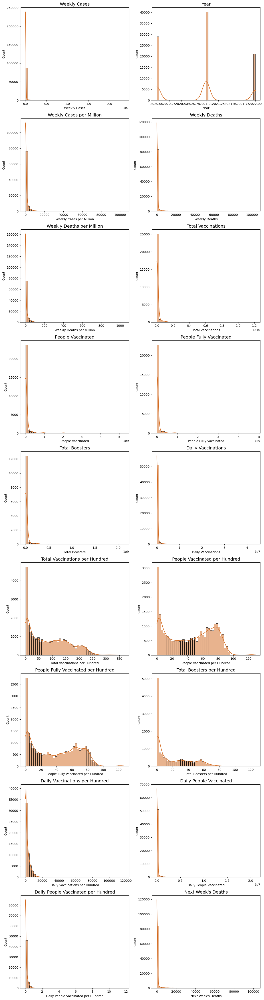

In [100]:
cols_per_row = 2
num_cols = len([col for col in train_set.drop(["Location", "Id"], axis=1).columns] )
rows = (num_cols + cols_per_row - 1) // cols_per_row  #calculation of required number of rows 

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(train_set.drop(["Location", "Id"], axis=1).columns):
    sns.histplot(ax = axes[i], x = train_set[col], bins=50, kde=True,  color='chocolate')
    axes[i].set_title(f'{col}', fontsize=14)

#Hide unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

**The columns have an asymmetric distribution (i.e., many outliers), which can affect the training phase.**

#### DEFINITION OF PREPROCESSING FUNCTIONS

In [103]:
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.preprocessing import OrdinalEncoder
import numpy as np
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import learning_curve
from math import sqrt


class Preprocessing:
    
    def __init__(self, df):
        self.df = df

    #Definition of Encoder Function
    def encoding(self) : 
        ord_encoder = OrdinalEncoder()
        for col in self.df.select_dtypes('object'):
            self.df[col] = ord_encoder.fit_transform(self.df[[col]])
    
       

    #Definition of Imputation
    def imputation(self):
        self.df = self.df.dropna(axis=0).reset_index(drop=True)
        #print(self.df.head(10))

    
    #Definition of Logarithme 
    #The logarithm reduces the asymmetries and stabilizes the variance.
    def logarithme(self):
        for col in list(self.df.columns):
            #if self.df[col].skew() >= 1:
            self.df.loc[:, col] =  np.log1p(self.df[col]) # = np.log(df[col]+1)
    
        
    

    #Definition of feature_engineering
    def feature_engineering(self):
    
        self.df = self.df.copy()
        
        self.df['Change in Weekly Cases'] = self.df['Weekly Cases'] - self.df['Weekly Cases'].shift(1)
        self.df['Change in Weekly Deaths'] = self.df['Weekly Deaths'] - self.df['Weekly Deaths'].shift(1)
    
        # Fill the first two rows of both columns with the value 0.
        self.df['Change in Weekly Cases'].fillna(0, inplace=True)
        self.df['Change in Weekly Deaths'].fillna(0, inplace=True)



    #Definition of RobustScaler
    def robust_scaler(self, df, target):
        
        df_r_scaler = RobustScaler()
        target_r_scaler = RobustScaler()
        
        df_scaled =  df_r_scaler.fit_transform(df)
        target_scaled = target_r_scaler.fit_transform(target.to_numpy().reshape(-1, 1)) #Because RobustScaler only accepts a 2D array, and a Pandas Series does not have a reshape method.

        df_scaled = pd.DataFrame(df_scaled, columns=df.columns) #Convert it into a DataFrame with the same columns because RobustScaler returns a NumPy array.
        target_scaled = pd.DataFrame(target_scaled, columns=[target.name])
        
        return df_scaled, target_scaled, target_r_scaler
    
    
    

    #Feature Selection
    #important : score_func=f_regression is for a continuous numerical target variable.
    def feature_selector(self, df, target, k):
        target1 = target.to_numpy().ravel() #because the selector need a 1D array 
        selector = SelectKBest(score_func=f_regression, k=k)
        selector.fit_transform(df, target1)
        selected_features = df.columns[selector.get_support()]
        
        return df[list(selected_features)]


    # Definition of Preprocessing Function
    def process(self):
        self.encoding()
        self.imputation()
        self.logarithme()
        self.feature_engineering()
        
        X = self.df.drop("Next Week's Deaths", axis=1)
        y = self.df["Next Week's Deaths"]

        X, y, val_r_scaler = self.robust_scaler(X, y)
        
        #X = self.feature_selector(X, y, 20)
 
        return X, y, val_r_scaler



    #evaluation function
    def evaluation(self, model, X_train, y_train, X_val, y_val, val_r_scaler):

        y_train = y_train.to_numpy().ravel()


        #Learning_curve and cross-validation
        N, train_score, val_score = learning_curve( model, X_train, y_train,
                                                   cv = 5, scoring='r2', train_sizes=np.linspace(0.1, 1, 10))

        #training of Model
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)

        # print(y_pred.shape)
        # print(y_val.shape)

        # print(y_pred)
        # print(y_val)
    
        # Calculation of the metrics, applying the inverse of the logarithm and RobustScaler beforehand to return to the original data.
        y_pred = np.expm1(val_r_scaler.inverse_transform(y_pred.reshape(-1,1)))  # RobustScaler expect a 2D array, y_pred is 1D
        y_val = np.expm1(val_r_scaler.inverse_transform(y_val.to_numpy())) # to_numpy, because y_val is a pandas dataframe 

        # print(y_pred)
        # print(y_val)
        
        mae = mean_absolute_error(y_pred, y_val)
        mse = mean_squared_error(y_pred, y_val)
        rmse = sqrt(mse)
        r2s = r2_score(y_pred, y_val)
        
        #creation of a Dataframes for  Metrics
        RegMetriken = pd.DataFrame(
            {
                "EVALUATION METRICS": ["Mean Absolute Erroe", "Mean Squared Error", "R2 Score", "Root Mean Squared Error"],
                "SCORES": [mae, mse, r2s, rmse]
            }
        )
        
        print(f"\n\nEvaluation results of the model\n\n {RegMetriken}\n\n")
        
        
    
        plt.figure(figsize=(14,7))
        
        plt.subplot(1,2,1)
        plt.plot(N, train_score.mean(axis=1), label='Train Score with cv=5')
        plt.plot(N, val_score.mean(axis=1), label='Validation Score with cv=5')
        plt.legend()
    
        plt.subplot(1,2,2)
        plt.scatter(y_val, y_pred)
        plt.xlabel("y Validation")
        plt.ylabel("y Predicted")
    
        plt.tight_layout()
        plt.show()
    
        #comparison of actual values and predicted ones
        comparison = pd.DataFrame({
        "Actual values(y_val)" : y_val.ravel() if len(y_val.shape) > 1 else y_val, #ravel, bcause pd.Dataframe needs a 1D array, Flatten with ravel()
        "predicted values(y_pred)" : y_pred.ravel() if len(y_pred.shape) > 1 else y_pred
    })
        comparison['Absolute Error'] = abs(comparison["Actual values(y_val)"] - comparison["predicted values(y_pred)"])
    
        print(f"Comparison of the predicted values with the actual values\n\n{comparison.head(10)}")
        
    
        print("\n****************************************************************************************************************************************")
    

In [104]:
#call of preprocessing function
train_preprocessing = Preprocessing(train_set)
X_train, y_train, _ = train_preprocessing.process()

val_preprocessing = Preprocessing(val_set)
X_val, y_val, val_r_scaler = val_preprocessing.process()

In [105]:
X_train.head()

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Change in Weekly Cases,Change in Weekly Deaths
0,-0.585821,-0.128480,-0.037661,0.0,0.623875,-0.220794,0.235415,-0.368344,-0.467034,-0.372089,0.102753,-0.655627,0.577877,0.395524,0.407971,0.506547,-0.599942,-0.648269,-0.275791,-0.000681,0.000000
1,-0.524440,-0.613165,-0.916861,0.0,-1.477418,-0.787966,-0.964828,0.031686,-0.000489,0.053349,0.240047,-0.271063,0.460992,0.476912,0.377903,0.367340,-0.447614,-0.436750,-0.302928,-0.664669,-0.410260
2,0.239260,0.288518,-0.640348,-1.0,-1.362314,-0.502756,-0.910295,-0.703450,-0.538985,-1.000148,-2.243335,0.062476,-3.480501,-4.032284,-4.696751,-0.685921,-0.199723,0.366111,0.772656,0.208147,0.206305
3,0.190797,0.612938,0.884800,-1.0,-0.295497,1.240838,0.269707,-0.382701,-0.899847,-4.293622,-2.001856,0.513833,-6.047904,-8.091639,-5.974225,-0.685921,-1.592151,0.357599,-0.366561,1.151139,1.261218
4,-0.227316,-0.148290,-0.087805,0.0,-0.657244,0.165473,-0.299145,0.520060,0.510786,0.531950,0.491690,0.057072,0.260589,0.176432,0.106625,0.323765,-0.634931,0.085567,-0.212785,-0.735210,-0.777858


In [106]:
y_train.head()

,Next Week's Deaths
0,-0.182779
1,-0.570141
2,-0.440645
3,1.253895
4,0.152041


In [107]:
X_val.head()

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Change in Weekly Cases,Change in Weekly Deaths
0,0.596986,-0.492328,0.979649,-1.0,0.319766,1.285056,0.963111,-0.540310,-0.329897,-1.072018,-1.854039,0.428265,-5.981057,-7.432045,-6.338454,-0.695839,-1.041286,0.743761,0.027133,0.000035,0.000000
1,-1.242596,0.288518,-0.530639,0.0,-0.356750,-0.179400,0.240976,-0.339854,-0.435509,-0.299885,0.113072,-1.011875,0.571539,0.358889,0.312561,0.488151,-1.539455,-1.026895,-0.378852,-1.131724,-1.100185
2,-1.206062,0.294906,-0.767186,-1.0,-1.638385,-0.624341,-0.991584,-0.828157,-0.664786,-1.086853,-2.191878,-0.015337,-4.138867,-4.920713,-5.466222,-0.695839,-0.396131,0.330038,0.647543,-0.177225,-0.334265
3,-0.462574,0.490516,0.811217,-1.0,0.242377,1.253682,1.174724,0.325344,0.466014,0.330110,-1.498679,0.775537,-2.682443,-3.266519,-3.340602,-0.695839,0.141841,0.908834,1.077399,1.182838,1.410880
4,-0.180188,0.458711,-0.047910,0.0,0.508739,-0.477714,-0.358206,-0.270373,-0.384608,-0.233330,0.164356,-0.609075,0.843306,0.629648,0.606726,0.572601,-0.561552,-0.821929,-0.350610,-0.643766,-1.300725


In [108]:
y_val.head()

,Next Week's Deaths
0,1.287218
1,-0.130583
2,-0.455893
3,1.223960
4,-0.706320


##### Variables distribution display after  Preprocessing

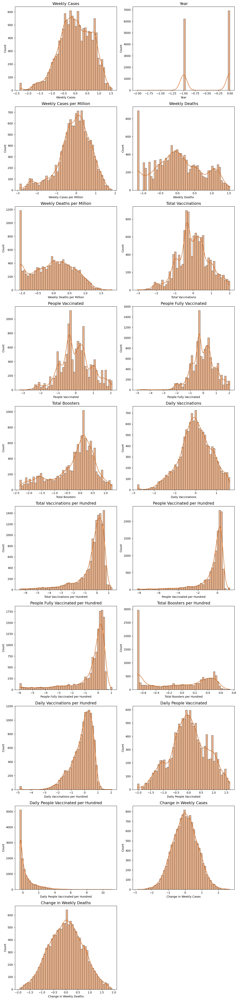

In [110]:
cols_per_row = 2

# check of the presence of columns befor we delete them
columns_to_drop = ["Location", "Id"] if all(col in X_train.columns for col in ["Location", "Id"]) else []
filtered_X_train = X_train.drop(columns_to_drop, axis=1)

num_cols = len(filtered_X_train.columns)
rows = (num_cols + cols_per_row - 1) // cols_per_row  #calculation of number of required rows 

fig, axes = plt.subplots(rows, cols_per_row, figsize=(12, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(filtered_X_train.columns):
    sns.histplot(ax = axes[i], x = X_train[col], bins=50, kde=True,  color='chocolate')
    axes[i].set_title(f'{col}', fontsize=14)


#Hide unnecessary axes when the number of columns is odd.
for j in range(num_cols, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

**Now the assymetric distribution of variables seems to be reduced.**

<Axes: ylabel='Count'>

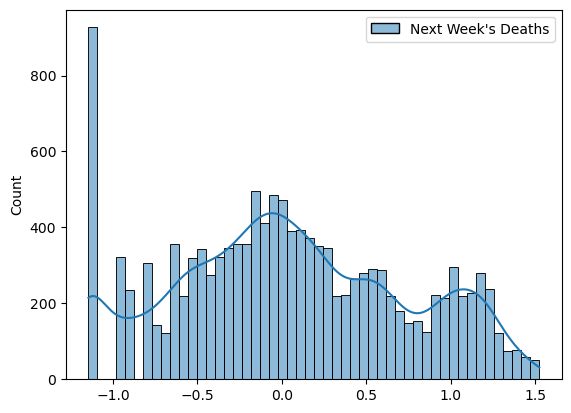

In [112]:
#Distribution of Target after preprocessing
sns.histplot(y_train, bins=50, kde=True)
#plt.title(f'{list(y_train.columns)[0]}', fontsize=14)

#### Evaluation and Diagnosis

##### First Model



Evaluation results of the model

         EVALUATION METRICS        SCORES
0      Mean Absolute Erroe  4.151796e+02
1       Mean Squared Error  1.768300e+06
2                 R2 Score  9.855552e-01
3  Root Mean Squared Error  1.329775e+03




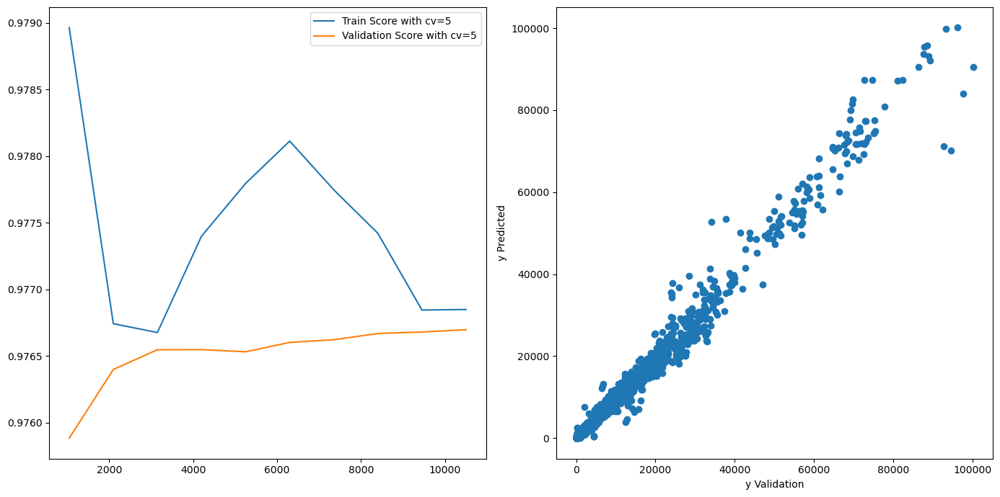

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              35331.979293     2363.020707
1                  74.0                 35.550778       38.449222
2                  17.0                  8.915562        8.084438
3               28560.0              25497.210696     3062.789304
4                   5.0                 17.077282       12.077282
5                   0.0                 -0.150388        0.150388
6                   5.0                  3.613460        1.386540
7                   3.0                  3.277905        0.277905
8                8548.0               9534.149272      986.149272
9                  46.0                 42.145341        3.854659

****************************************************************************************************************************************


In [115]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
val_preprocessing.evaluation(model, X_train, y_train, X_val, y_val, val_r_scaler)

# III. MODELLING AND TRAINING

### Evaluation and  Optimization class

In [118]:
from sklearn.model_selection import GridSearchCV
import time
from tqdm import tqdm

class Training(Preprocessing):

    def __init__(self, df):
        super().__init__(df)
        
    #Redefinition of Method process() 
    def process(self):
        self.encoding()
        self.imputation()
        self.logarithme()
        self.feature_engineering()
        
        X = self.df.drop("Next Week's Deaths", axis=1)
        y = self.df["Next Week's Deaths"]

        X, y, val_r_scaler = self.robust_scaler(X, y)
        
        return X, y, val_r_scaler



    #evaluation function
    def assess(self, model, X_train, y_train, X_val, y_val, val_r_scaler):

        y_train = y_train.to_numpy().ravel()

        #training of Model
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)

        # Calculation of the metrics, applying the inverse of the logarithm and RobustScaler beforehand to return to the original data.
        y_pred = np.expm1(val_r_scaler.inverse_transform(y_pred.reshape(-1,1))) 
        y_val = np.expm1(val_r_scaler.inverse_transform(y_val.to_numpy())) 

        mae = mean_absolute_error(y_pred, y_val)
        mse = mean_squared_error(y_pred, y_val)
        rmse = sqrt(mse)
        r2s = r2_score(y_pred, y_val)
        
        #creation of a Dataframes for Metrics
        RegMetriken = pd.DataFrame(
            {
                "EVALUATION METRICS": ["Mean Absolute Erroe", "Mean Squared Error", "R2 Score", "Root Mean Squared Error"],
                "SCORES": [mae, mse, r2s, rmse]
            }
        )
        
        print(f"\n\nEEvaluation results of the model\n\n {RegMetriken}\n\n")
        
        plt.figure()
        
        plt.scatter(y_val, y_pred)
        plt.xlabel("y Validation")
        plt.ylabel("y Predicted")
    
        plt.show()
    
       #comparison of actual values and predicted ones
        comparison = pd.DataFrame({
        "Actual values(y_val)" : y_val.ravel() if len(y_val.shape) > 1 else y_val, #ravel, bcause pd.Dataframe needs a 1D array, Flatten with ravel()
        "predicted values(y_pred)" : y_pred.ravel() if len(y_pred.shape) > 1 else y_pred
    })
        comparison['Absolute Error'] = abs(comparison["Actual values(y_val)"] - comparison["predicted values(y_pred)"])
    
        print(f"Comparison of the predicted values with the actual values\n\n{comparison.head(10)}")
        


    def optimize(self, model_dict, param_dict, X_train, y_train, X_val, y_val, val_r_scaler):
            start_time = time.time()
            print(f"Optimisation started at {time.strftime('%H:%M:%S', time.localtime(start_time))}")
        
            for name, model in tqdm(model_dict.items(), desc="Optimisation in process", unit="model"):
                print(f"************************* {name.upper()} ****************************")
                grid = GridSearchCV(model, param_dict[name], cv = 5, scoring='r2')
                self.assess(grid, X_train, y_train, X_val, y_val, val_r_scaler)
                print(f"BEST ESTIMATOR : {grid.best_estimator_.get_params()}")
                print(f"BEST PARAMETERS : {grid.best_params_}")
                print(f"BEST SCORE : {grid.best_score_}")
                
                print("\n****************************************************************************************************************************************")

            # display of the execution time
            end_time = time.time()
            elapsed_time = end_time - start_time
            estimated_end_time = start_time + elapsed_time  # Heure estimée de fin
            print(f"Optimisation finished at {time.strftime('%H:%M:%S', time.localtime(estimated_end_time))}")
            print(f"Total time : {elapsed_time / 60:.2f} minutes")

        

### Training of different models

In [120]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR

KNN = KNeighborsRegressor()
RandomForest = RandomForestRegressor(random_state=0)
SVR = SVR()
DecisionTree = DecisionTreeRegressor(random_state=0)
LRegressor = LinearRegression()

In [121]:
model_dict = {
    'KNN': KNN,
    'SVR': SVR,
    'DecisionTree': DecisionTree,
    'LRegressor': LRegressor,
    'RandomForest': RandomForest
}

In [122]:
train_training = Training(train_set)
X_train, y_train, _ = train_training.process()

val_Training = Training(val_set)
X_val, y_val, val_r_scaler = val_Training.process()

In [123]:
X_val.head()

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Change in Weekly Cases,Change in Weekly Deaths
0,0.596986,-0.492328,0.979649,-1.0,0.319766,1.285056,0.963111,-0.540310,-0.329897,-1.072018,-1.854039,0.428265,-5.981057,-7.432045,-6.338454,-0.695839,-1.041286,0.743761,0.027133,0.000035,0.000000
1,-1.242596,0.288518,-0.530639,0.0,-0.356750,-0.179400,0.240976,-0.339854,-0.435509,-0.299885,0.113072,-1.011875,0.571539,0.358889,0.312561,0.488151,-1.539455,-1.026895,-0.378852,-1.131724,-1.100185
2,-1.206062,0.294906,-0.767186,-1.0,-1.638385,-0.624341,-0.991584,-0.828157,-0.664786,-1.086853,-2.191878,-0.015337,-4.138867,-4.920713,-5.466222,-0.695839,-0.396131,0.330038,0.647543,-0.177225,-0.334265
3,-0.462574,0.490516,0.811217,-1.0,0.242377,1.253682,1.174724,0.325344,0.466014,0.330110,-1.498679,0.775537,-2.682443,-3.266519,-3.340602,-0.695839,0.141841,0.908834,1.077399,1.182838,1.410880
4,-0.180188,0.458711,-0.047910,0.0,0.508739,-0.477714,-0.358206,-0.270373,-0.384608,-0.233330,0.164356,-0.609075,0.843306,0.629648,0.606726,0.572601,-0.561552,-0.821929,-0.350610,-0.643766,-1.300725


In [124]:
y_val.head()

,Next Week's Deaths
0,1.287218
1,-0.130583
2,-0.455893
3,1.223960
4,-0.706320


### Evaluation of the models

Training started at 00:34:03


Training in process:   0%|          | 0/5 [00:00<?, ?model/s]

************************* KNN ****************************


Evaluation results of the model

         EVALUATION METRICS        SCORES
0      Mean Absolute Erroe  5.439604e+02
1       Mean Squared Error  3.409667e+06
2                 R2 Score  9.732547e-01
3  Root Mean Squared Error  1.846528e+03




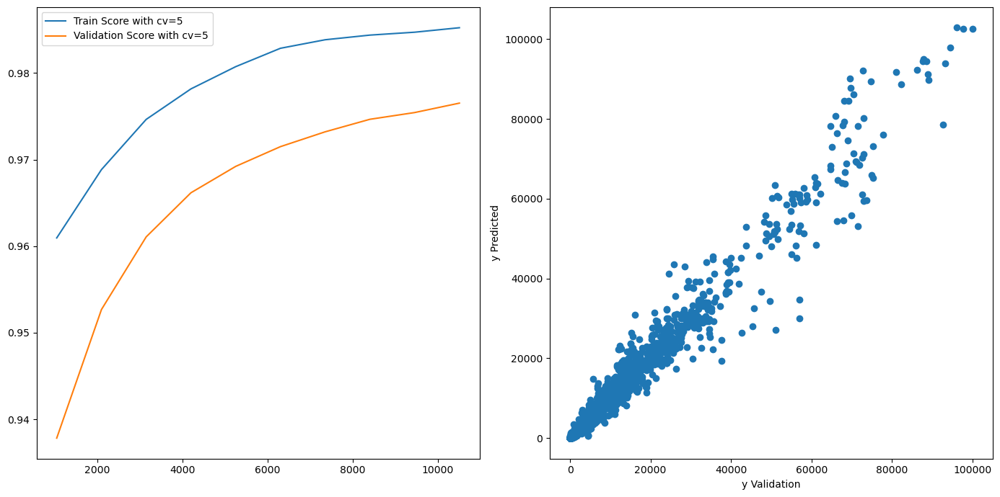

Training in process:  20%|██        | 1/5 [00:09<00:38,  9.72s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              19445.207310    18249.792690
1                  74.0                 42.697860       31.302140
2                  17.0                 11.593919        5.406081
3               28560.0              30775.108425     2215.108425
4                   5.0                  8.819630        3.819630
5                   0.0                 -0.124869        0.124869
6                   5.0                  4.798278        0.201722
7                   3.0                  4.880070        1.880070
8                8548.0               9679.340430     1131.340430
9                  46.0                 94.154328       48.154328

****************************************************************************************************************************************
************************* SVR ****************************


Evaluation resul

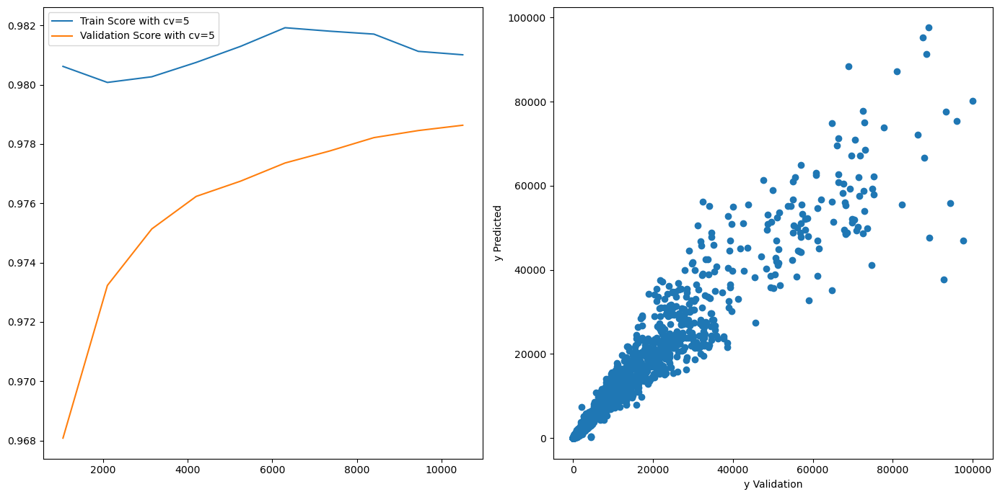

Training in process:  40%|████      | 2/5 [00:55<01:33, 31.21s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              23656.488879    14038.511121
1                  74.0                 37.888822       36.111178
2                  17.0                  8.969101        8.030899
3               28560.0              34637.043302     6077.043302
4                   5.0                 15.811865       10.811865
5                   0.0                 -0.107570        0.107570
6                   5.0                  4.459964        0.540036
7                   3.0                  4.209750        1.209750
8                8548.0               8992.794064      444.794064
9                  46.0                 66.684992       20.684992

****************************************************************************************************************************************
************************* DECISIONTREE ****************************


Evaluat

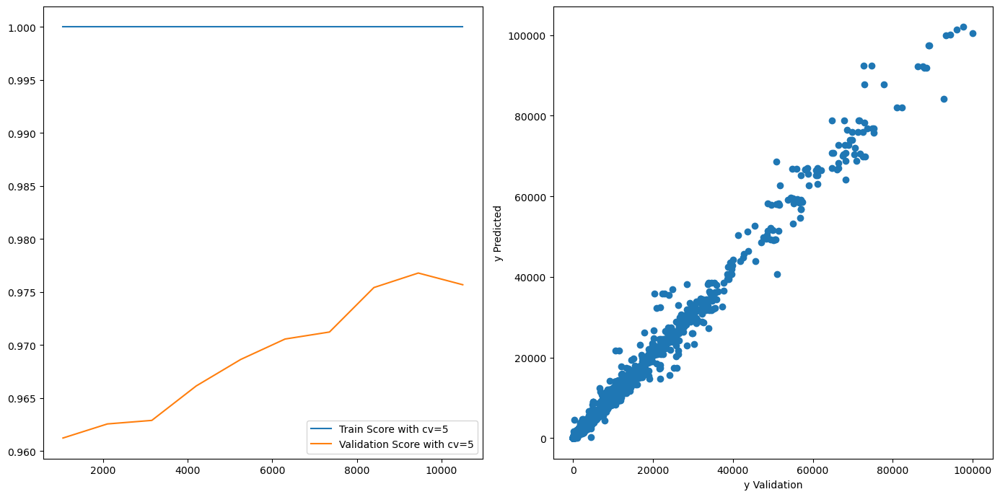

Training in process:  60%|██████    | 3/5 [00:59<00:37, 18.76s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              38450.765753      755.765753
1                  74.0                 13.602752       60.397248
2                  17.0                 14.529680        2.470320
3               28560.0              31941.457392     3381.457392
4                   5.0                 10.827472        5.827472
5                   0.0                 -0.124869        0.124869
6                   5.0                  0.768737        4.231263
7                   3.0                  2.574817        0.425183
8                8548.0               9589.987510     1041.987510
9                  46.0                 31.324574       14.675426

****************************************************************************************************************************************
************************* LREGRESSOR ****************************


Evaluatio

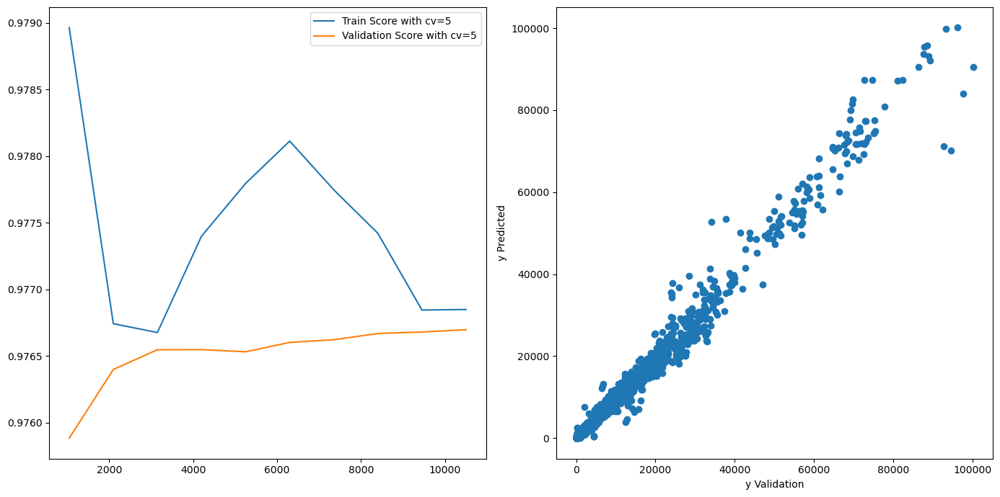

Training in process:  80%|████████  | 4/5 [01:00<00:11, 11.50s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              35331.979293     2363.020707
1                  74.0                 35.550778       38.449222
2                  17.0                  8.915562        8.084438
3               28560.0              25497.210696     3062.789304
4                   5.0                 17.077282       12.077282
5                   0.0                 -0.150388        0.150388
6                   5.0                  3.613460        1.386540
7                   3.0                  3.277905        0.277905
8                8548.0               9534.149272      986.149272
9                  46.0                 42.145341        3.854659

****************************************************************************************************************************************
************************* RANDOMFOREST ****************************


Evaluat

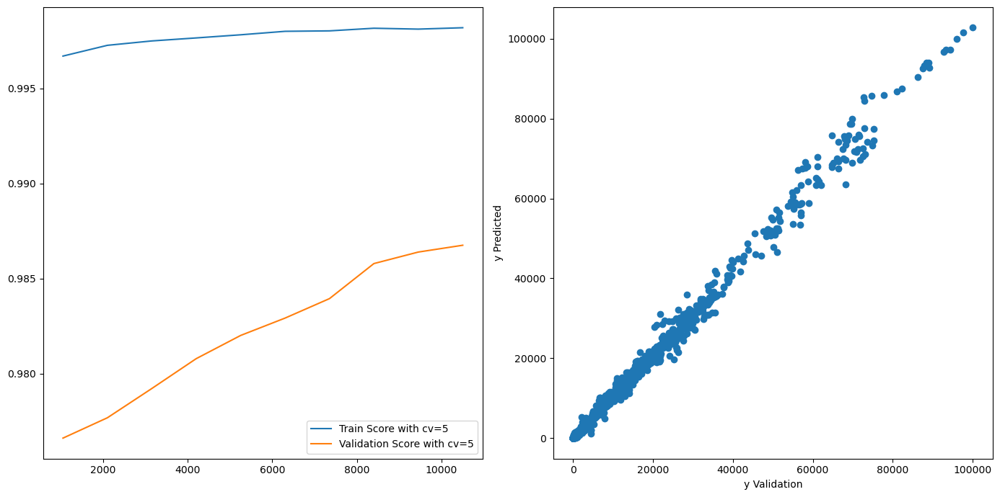

Training in process: 100%|██████████| 5/5 [08:10<00:00, 98.14s/model] 

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              37933.986385      238.986385
1                  74.0                 47.958062       26.041938
2                  17.0                 10.593458        6.406542
3               28560.0              31415.986511     2855.986511
4                   5.0                 13.096239        8.096239
5                   0.0                 -0.074194        0.074194
6                   5.0                  5.170897        0.170897
7                   3.0                  2.511988        0.488012
8                8548.0               9588.854733     1040.854733
9                  46.0                 40.165745        5.834255

****************************************************************************************************************************************
Training finished at 00:42:13
Total time : 8.18 minutes


In [126]:
import time
from tqdm import tqdm

start_time = time.time()
print(f"Training started at {time.strftime('%H:%M:%S', time.localtime(start_time))}")

for name, model in tqdm(model_dict.items(), desc="Training in process", unit="model"):
    print(f"************************* {name.upper()} ****************************")
    train_training.evaluation(model, X_train, y_train, X_val, y_val, val_r_scaler)

# Anzeige der Ausführungszeit
end_time = time.time()
elapsed_time = end_time - start_time
estimated_end_time = start_time + elapsed_time  # Heure estimée de fin
print(f"Training finished at {time.strftime('%H:%M:%S', time.localtime(estimated_end_time))}")
print(f"Total time : {elapsed_time / 60:.2f} minutes")

#### Optimization

In [128]:
for name, model in model_dict.items():
    print(f"******************{name.upper()}*******************")
    print(model.get_params())

******************KNN*******************
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
******************SVR*******************
{'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
******************DECISIONTREE*******************
{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
******************LREGRESSOR*******************
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
******************RANDOMFOREST*******************
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 

In [129]:
knn_hyper_params = {
    'n_neighbors': [3,5, 7, 10],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
}

svr_hyper_params = {
    'C': [0.1, 1.0],
    
}

tree_hyper_params = {
    'max_depth': [5, 10, 15, 20, None],
    
}
lregressor_hyper_params = {
    'positive': [False, True]
}

randomforest_hyper_params = {
    'max_depth': [5, 10, None],
    'min_samples_leaf': [1, 2],
    'min_samples_split': [2, 3],
    'n_estimators': [100]
    
}

In [130]:
param_dict = {
    'KNN': knn_hyper_params,
    'SVR': svr_hyper_params,
    'DecisionTree': tree_hyper_params,
    'LRegressor': lregressor_hyper_params,
    'RandomForest': randomforest_hyper_params
}

Optimisation started at 00:42:13


Optimisation in process:   0%|          | 0/5 [00:00<?, ?model/s]

************************* KNN ****************************


EEvaluation results of the model

         EVALUATION METRICS        SCORES
0      Mean Absolute Erroe  3.235717e+02
1       Mean Squared Error  1.202035e+06
2                 R2 Score  9.908134e-01
3  Root Mean Squared Error  1.096373e+03




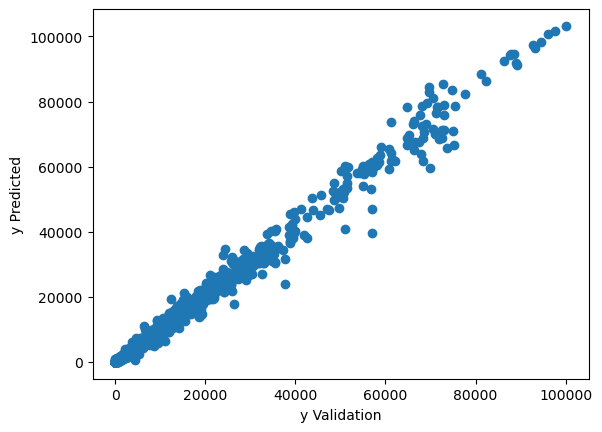

Optimisation in process:  20%|██        | 1/5 [00:13<00:55, 13.83s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              24002.241892    13692.758108
1                  74.0                 50.192312       23.807688
2                  17.0                 11.505044        5.494956
3               28560.0              31444.161664     2884.161664
4                   5.0                  8.471164        3.471164
5                   0.0                 -0.124869        0.124869
6                   5.0                  4.398123        0.601877
7                   3.0                  4.481572        1.481572
8                8548.0               8394.523774      153.476226
9                  46.0                 59.712906       13.712906
BEST ESTIMATOR : {'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 1, 'weights': 'distance'}
BEST PARAMETERS : {'n_neighbors': 5, 'p': 1, 'we

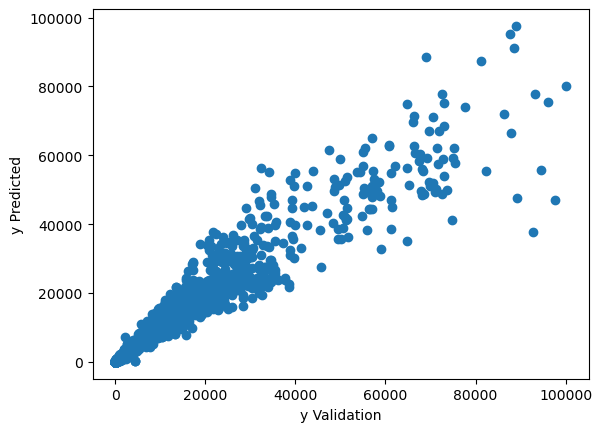

Optimisation in process:  40%|████      | 2/5 [00:25<00:37, 12.42s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              23656.488879    14038.511121
1                  74.0                 37.888822       36.111178
2                  17.0                  8.969101        8.030899
3               28560.0              34637.043302     6077.043302
4                   5.0                 15.811865       10.811865
5                   0.0                 -0.107570        0.107570
6                   5.0                  4.459964        0.540036
7                   3.0                  4.209750        1.209750
8                8548.0               8992.794064      444.794064
9                  46.0                 66.684992       20.684992
BEST ESTIMATOR : {'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
BEST PARAMETERS : {'C':

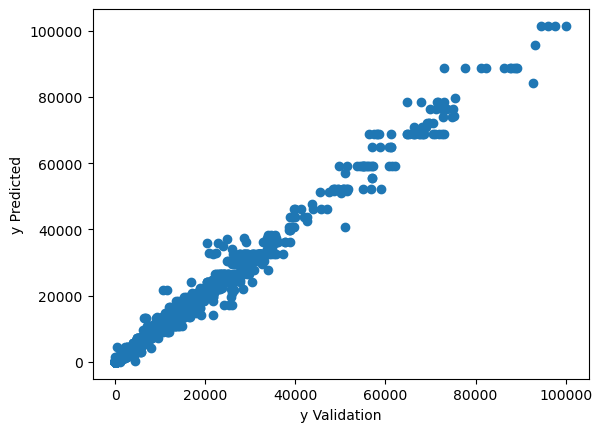

Optimisation in process:  60%|██████    | 3/5 [00:28<00:16,  8.06s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              36137.545756     1557.454244
1                  74.0                 38.431932       35.568068
2                  17.0                  4.395264       12.604736
3               28560.0              32619.217244     4059.217244
4                   5.0                 14.474709        9.474709
5                   0.0                 -0.061780        0.061780
6                   5.0                  6.116067        1.116067
7                   3.0                  2.574817        0.425183
8                8548.0               9150.612582      602.612582
9                  46.0                 28.012211       17.987789
BEST ESTIMATOR : {'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weig

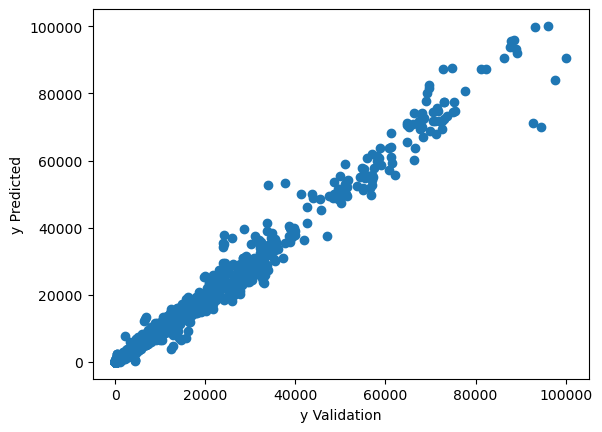

Optimisation in process:  80%|████████  | 4/5 [00:28<00:04,  4.93s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              35331.979293     2363.020707
1                  74.0                 35.550778       38.449222
2                  17.0                  8.915562        8.084438
3               28560.0              25497.210696     3062.789304
4                   5.0                 17.077282       12.077282
5                   0.0                 -0.150388        0.150388
6                   5.0                  3.613460        1.386540
7                   3.0                  3.277905        0.277905
8                8548.0               9534.149272      986.149272
9                  46.0                 42.145341        3.854659
BEST ESTIMATOR : {'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
BEST PARAMETERS : {'positive': False}
BEST SCORE : 0.9766969510924867

****************************************************

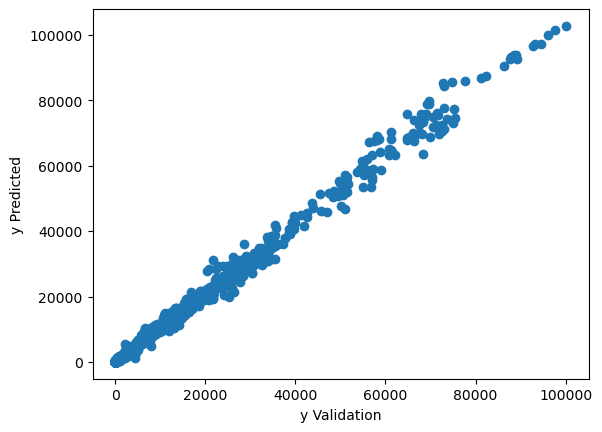

Optimisation in process: 100%|██████████| 5/5 [11:06<00:00, 133.27s/model]

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              37933.986385      238.986385
1                  74.0                 47.958062       26.041938
2                  17.0                 10.593458        6.406542
3               28560.0              31415.986511     2855.986511
4                   5.0                 13.096239        8.096239
5                   0.0                 -0.074194        0.074194
6                   5.0                  5.170897        0.170897
7                   3.0                  2.511988        0.488012
8                8548.0               9588.854733     1040.854733
9                  46.0                 40.165745        5.834255
BEST ESTIMATOR : {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_le

In [131]:
train_training.optimize(model_dict, param_dict, X_train, y_train, X_val, y_val, val_r_scaler)

### Usage of ensemble Learners

#### The Voting

Voting is an ensemble learning technique that combines the predictions of multiple models to obtain a final prediction. In classification, the final class is chosen by majority voting or weighted voting, and in regression, it is the average of the predictions. The base models can already be trained before they are used in the voting system. The voting estimator does not retrain the base models but only learns how to combine their outputs.

![Voting technic](images/voting.jpeg)

In [134]:
from sklearn.ensemble import VotingRegressor

#Usage of trained Models for voting method
voting_model = VotingRegressor([(name, model) for name,model in model_dict.items()])



EEvaluation results of the model

         EVALUATION METRICS        SCORES
0      Mean Absolute Erroe  3.178563e+02
1       Mean Squared Error  1.021972e+06
2                 R2 Score  9.915009e-01
3  Root Mean Squared Error  1.010926e+03




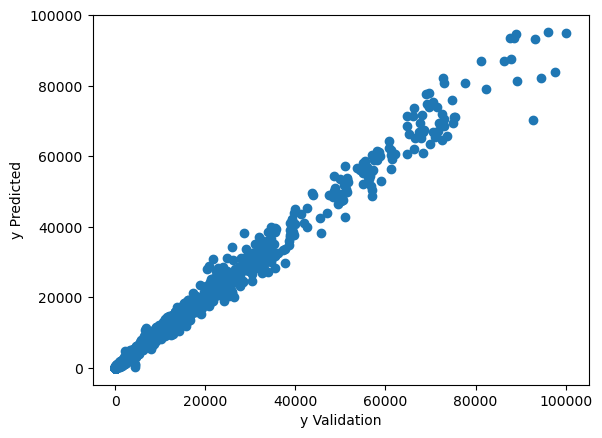

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              29852.001794     7842.998206
1                  74.0                 32.844500       41.155500
2                  17.0                 10.751734        6.248266
3               28560.0              30700.664524     2140.664524
4                   5.0                 12.783765        7.783765
5                   0.0                 -0.116733        0.116733
6                   5.0                  3.370241        1.629759
7                   3.0                  3.397921        0.397921
8                8548.0               9473.739624      925.739624
9                  46.0                 50.711213        4.711213


In [135]:
train_training.assess(voting_model, X_train, y_train, X_val, y_val, val_r_scaler)

#### The Bagging
The idea is to create multiple instances of a model (e.g., multiple decision trees) and train each of these instances on a random subset of our dataset. This is done using a sampling technique called **BOOTSTRAPPING**, where random samples are drawn with replacement from the dataset. This means that after each selection, the selected data is put back into the dataset and can be selected again.

In this way, a variety of models is created, each of which differs from the others because they were not all trained on the same data. Nevertheless, they share some common knowledge as they originate from the same original dataset.

Once this ensemble of models is created, their predictions are combined (e.g., by averaging for regression problems or by majority vote for classification problems) to obtain the final prediction.

The most well-known example of an algorithm that uses this method is Random Forest, which uses decision trees as base models and additionally introduces a random selection of features to create even more diversity.

![Bagging technic](images/Bagging.png)

In [137]:
from sklearn.ensemble import BaggingRegressor

bagging_model = BaggingRegressor(estimator = RandomForestRegressor(n_estimators=100, random_state=0), 
                                 n_estimators = 10, random_state=0)



EEvaluation results of the model

         EVALUATION METRICS        SCORES
0      Mean Absolute Erroe  3.082179e+02
1       Mean Squared Error  1.022234e+06
2                 R2 Score  9.923474e-01
3  Root Mean Squared Error  1.011056e+03




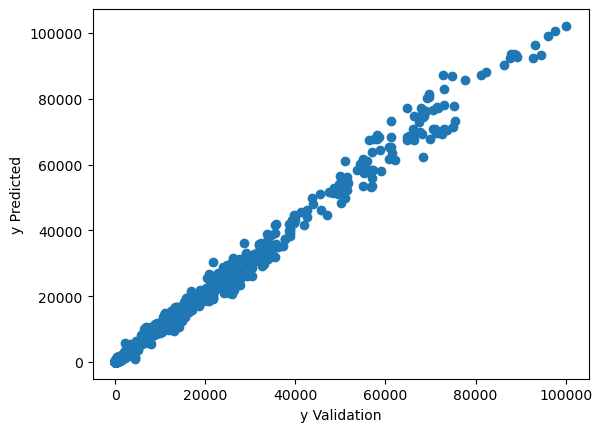

Comparison of the predicted values with the actual values

   Actual values(y_val)  predicted values(y_pred)  Absolute Error
0               37695.0              37328.653960      366.346040
1                  74.0                 46.933021       27.066979
2                  17.0                  8.652566        8.347434
3               28560.0              31405.944083     2845.944083
4                   5.0                 13.697607        8.697607
5                   0.0                 -0.024513        0.024513
6                   5.0                  5.294709        0.294709
7                   3.0                  3.060650        0.060650
8                8548.0               9606.377374     1058.377374
9                  46.0                 38.737063        7.262937


In [138]:
train_training.assess(bagging_model, X_train, y_train, X_val, y_val, val_r_scaler)

#### SAVING THE BEST MODELS ON THE HARD DISK

In [140]:
import joblib

joblib.dump(model_dict['RandomForest'], 'RandomForest.pkl')
joblib.dump(bagging_model, 'bagging_model.pkl')
joblib.dump(voting_model, 'voting_model.pkl')
joblib.dump(model_dict['KNN'], 'KNN_regressor.pkl')

['KNN_regressor.pkl']

# IV. TEST PHASE

In [142]:
class Test(Training):

    def __init__(self, df):
        super().__init__(df)

    #Redefinition of the method assess() (important: the class Test inherits from the class Training, and assess() is a method of the Training class)
    def assess(self, model, X_test, test_df_r_scaler):
        #test
        y_pred = model.predict(X_test)
        
        #Calculation of the metrics, applying the inverse of the logarithm and RobustScaler beforehand to return to the original data
        y_pred = np.expm1(val_r_scaler.inverse_transform(y_pred.reshape(-1,1))) 

        print(y_pred)

        return y_pred

    

    


    def test(self, test_model_dict, X_test, test_df_r_scaler):

        list_prediction = []

        for name, model in tqdm(test_model_dict.items(), desc="Test in process", unit="model"):
            
                print(f"************************* {name.upper()} ****************************")
                list_prediction.append(self.assess(model, X_test, test_df_r_scaler))
                
                print("\n****************************************************************************************************************************************")
        return list_prediction


    #Redefinition of the method process() (important: the class Test inherits from the class Training, which in turn inherits from the class Preprocessing, and process() is a method of the Preprocessing class)
    def process(self):
        self.encoding()
        self.imputation()
        
        ids = self.df['Id'] # we need Ids at the End
        
        self.logarithme()
        self.feature_engineering()
        
        X = self.df

        X, test_df_r_scaler = self.robust_scaler(X)
        
        #X = self.feature_selector(X, y, 20)
 
        return X, test_df_r_scaler, ids


    #Redefinition of the method robust_scaler() (important: robust_scaler is a method of the Preprocessing class)
    def robust_scaler(self, df):
        
        df_r_scaler = RobustScaler()
        
        df_scaled =  df_r_scaler.fit_transform(df)
        df_scaled = pd.DataFrame(df_scaled, columns=df.columns) #Convert into a DataFrame with the same columns because R_scaler returns a NumPy array
        
        
        return df_scaled, df_r_scaler




In [143]:
import pandas as pd

test_df = pd.read_csv("test.csv")
test_df.head()

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred
0,719557359,Monaco,185.0,2021,5042.796,0.0,0.00,NaN,NaN,NaN,NaN,158.0,NaN,NaN,NaN,NaN,4307.0,23.0,0.063
1,507527289,Liechtenstein,78.0,2020,1998.002,0.0,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,821551528,Albania,230.0,2022,80.569,1.0,0.35,NaN,NaN,NaN,NaN,1462.0,NaN,NaN,NaN,NaN,512.0,391.0,0.014
3,696602016,Niger,14.0,2022,0.554,1.0,0.04,NaN,NaN,NaN,NaN,72018.0,NaN,NaN,NaN,NaN,2852.0,60442.0,0.239
4,680387432,French Polynesia,1033.0,2022,3397.669,0.0,0.00,366984.0,186177.0,180807.0,NaN,22.0,120.71,61.24,59.47,NaN,72.0,22.0,0.007


In [144]:
test_phase = Test(test_df)
X_test, test_df_r_scaler, ids  = test_phase.process()

In [145]:
X_test

,Id,Location,Weekly Cases,Year,Weekly Cases per Million,Weekly Deaths,Weekly Deaths per Million,Total Vaccinations,People Vaccinated,People Fully Vaccinated,Total Boosters,Daily Vaccinations,Total Vaccinations per Hundred,People Vaccinated per Hundred,People Fully Vaccinated per Hundred,Total Boosters per Hundred,Daily Vaccinations per Hundred,Daily People Vaccinated,Daily People Vaccinated per Hundred,Change in Weekly Cases,Change in Weekly Deaths
0,-1.634584,0.469428,0.186898,0.0,1.412112,-0.029017,1.085003,-0.802663,-0.880560,-0.761293,-0.176061,-0.864281,0.003449,-0.225067,-0.092652,0.296336,-0.628524,-0.980298,-0.327188,0.003773,0.000000
1,-0.826544,0.584921,0.471627,-1.0,0.370561,0.534240,0.446165,0.426122,0.451422,0.473237,0.345086,0.343477,-0.049973,-0.067670,-0.147440,0.087666,0.086093,0.340035,0.189086,0.225411,0.417222
2,0.606988,0.589646,-1.617883,0.0,-0.328736,-1.147918,-1.093027,-2.067439,-2.185036,-2.018231,-0.946753,-2.008936,0.131755,0.085528,0.108000,0.150845,-1.118003,-1.507219,-0.184249,-1.622740,-1.246025
3,0.130023,-3.964431,0.096595,0.0,-1.507476,0.562449,-0.679214,0.868243,1.003679,0.944487,0.376941,0.807095,-2.091770,-2.457100,-2.270112,-0.505914,-0.496687,0.965761,0.239977,1.338355,1.266920
4,-1.805496,-0.732684,-0.832521,-1.0,-0.120944,-0.827714,-0.312624,-1.113260,-1.145369,-1.023661,-0.829965,-0.879444,-0.082290,-0.006031,0.037740,-0.418379,-0.132745,-0.788337,-0.078505,-0.719468,-1.029736
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6171,0.006661,0.495718,0.264052,0.0,0.193502,-0.084225,-0.525849,0.460568,0.382710,0.456069,0.549975,-0.235357,0.776282,0.517459,0.535745,0.560944,-1.047233,-0.698768,-0.372324,0.350397,0.073704
6172,-0.252339,0.464084,0.076095,-1.0,0.803245,0.337578,1.425608,-1.436394,-1.373290,-1.503516,-2.187556,-0.435636,-3.798613,-4.597111,-4.521689,-0.712987,-0.148557,-0.160824,0.490230,-0.142536,0.312442
6173,-0.131281,0.294906,0.608054,0.0,0.899515,0.213560,0.081639,0.274570,0.223003,0.290489,0.402823,-0.096322,0.220077,-0.070711,0.013017,0.363134,-0.607518,-0.109239,-0.237587,0.417860,-0.091864
6174,-0.026174,0.617531,0.753401,-1.0,-0.545681,1.073568,-0.059163,1.632724,1.709303,1.705087,0.845696,1.395490,0.227496,0.275930,0.256214,-0.061598,0.602377,1.104047,0.273746,0.116914,0.637034


In [146]:
#Reading the saved models from disk
test_model_dict = {
    'RandomForest': joblib.load('RandomForest.pkl'),
    'baggingModel': joblib.load('bagging_model.pkl'),
    'KNN': joblib.load('KNN_regressor.pkl'),
    'votingModel': joblib.load('voting_model.pkl'),
    
}

In [147]:
list_prediction = test_phase.test(test_model_dict, X_test, test_df_r_scaler)

Test in process:   0%|          | 0/4 [00:00<?, ?model/s]

************************* RANDOMFOREST ****************************
[[ 1.05510883e+02]
 [ 1.45149285e+03]
 [-6.92630444e-02]
 ...
 [ 3.42114961e+02]
 [ 1.28330564e+04]
 [ 1.18808062e+01]]

****************************************************************************************************************************************
************************* BAGGINGMODEL ****************************


Test in process:  50%|█████     | 2/4 [00:00<00:00,  2.34model/s]

[[1.06267484e+02]
 [1.44855759e+03]
 [4.76299157e-02]
 ...
 [3.48101929e+02]
 [1.28329333e+04]
 [1.20982205e+01]]

****************************************************************************************************************************************
************************* KNN ****************************


Test in process:  75%|███████▌  | 3/4 [00:01<00:00,  2.92model/s]

[[ 1.03785727e+02]
 [ 1.43600541e+03]
 [-1.24869425e-01]
 ...
 [ 3.14189143e+02]
 [ 1.71584194e+04]
 [ 1.02487491e+01]]

****************************************************************************************************************************************
************************* VOTINGMODEL ****************************


Test in process: 100%|██████████| 4/4 [00:02<00:00,  1.89model/s]

[[ 1.07463654e+02]
 [ 1.51975673e+03]
 [-1.30197477e-01]
 ...
 [ 3.67020248e+02]
 [ 1.33278466e+04]
 [ 1.09833060e+01]]

****************************************************************************************************************************************


In [148]:
# The predictions from RandomForest are considered the best here, because it was the best model during training and optimization
best_prediction = list_prediction[0]
best_prediction = pd.DataFrame(best_prediction, columns=["Next Week's Deaths"])
best_prediction

,Next Week's Deaths
0,105.510883
1,1451.492851
2,-0.069263
3,697.491272
4,3.784387
...,...
6171,96.532840
6172,599.035028
6173,342.114961
6174,12833.056432


In [149]:
ids = pd.DataFrame(ids, columns=['Id'])
ids
                   

,Id
0,140935772
1,277427273
2,922479531
3,618501440
4,122126258
...,...
6171,557746600
6172,448911171
6173,496850584
6174,542606568


## THE FINAL PREDICTIONS AND SUBMISSION FILE

In [151]:
#The final predictions
covid_predictions = ids.copy()
covid_predictions["Next Week's Deaths"] = best_prediction["Next Week's Deaths"]
covid_predictions

,Id,Next Week's Deaths
0,140935772,105.510883
1,277427273,1451.492851
2,922479531,-0.069263
3,618501440,697.491272
4,122126258,3.784387
...,...,...
6171,557746600,96.532840
6172,448911171,599.035028
6173,496850584,342.114961
6174,542606568,12833.056432


In [152]:
covid_predictions.to_csv("covid_predictions.csv", index=False)  # index=False to avoid saving indexes
covid_predictions.to_excel("covid_predictions.xlsx", index=False)
print("CSV FILE SAVED.")
print("XLSX FILE SAVED.")

CSV FILE SAVED.
XLSX FILE SAVED.


# THERE IS STILL ROOM FOR IMPROVEMENT
**The models are not perfect and can be further improved by exploring and combining additional parameters with GridSearchCV and RandomizedSearchCV to increase prediction accuracy.**

In [154]:
for name, model in model_dict.items():
    print(f"******************{name.upper()}*******************")
    print(model.get_params())

******************KNN*******************
{'algorithm': 'auto', 'leaf_size': 30, 'metric': 'minkowski', 'metric_params': None, 'n_jobs': None, 'n_neighbors': 5, 'p': 2, 'weights': 'uniform'}
******************SVR*******************
{'C': 1.0, 'cache_size': 200, 'coef0': 0.0, 'degree': 3, 'epsilon': 0.1, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'shrinking': True, 'tol': 0.001, 'verbose': False}
******************DECISIONTREE*******************
{'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'random_state': 0, 'splitter': 'best'}
******************LREGRESSOR*******************
{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}
******************RANDOMFOREST*******************
{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 

# CONCLUSION
**In summary, this project represents an important step in predicting COVID-19 deaths based on weekly data. Through analysis and modeling, a basic approach was developed that could be useful in real-world applications.**

**Additionally, working on this project was a valuable learning experience. It allowed me to gain deeper knowledge in the fields of machine learning, data analysis, and model evaluation. I developed a better understanding of the challenges and potential of forecasting models and learned to solve complex problems using data-driven approaches.**

**Despite the progress made, the model is not perfect and leaves room for improvement. Incorporating additional relevant parameters, optimizing the algorithms, and using more advanced techniques could significantly enhance the prediction accuracy.**

**This project has shown how important data analysis and modeling are in forecasting critical events, and it provides a solid foundation for future work in this area.**